In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
import time
from sklearn.metrics import f1_score
import csv
import seaborn as sns
from neural_network import * 

# Part 1 - multimodal

In [2]:
layers1 = [1, 100, 1]
layers2 = [1, 25, 1]


layers3 = [1, 15, 25, 1]
layers4 = [1, 35, 40, 1]


layers5 = [1, 10, 25, 10, 1]
layers6 = [1, 3, 18, 6, 1]


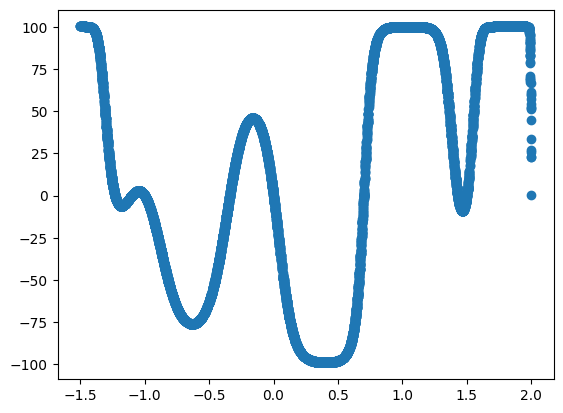

In [4]:
train_df = pd.read_csv('data/multimodal-large-training.csv')
test_df = pd.read_csv('data/multimodal-large-test.csv')

X_train, Y_train=train_df['x'].to_numpy().reshape(-1,1), train_df['y'].to_numpy().reshape(-1,1)
X_test, Y_test=test_df['x'].to_numpy().reshape(-1,1), test_df['y'].to_numpy().reshape(-1,1)

x_scaler = MinMaxScaler()
y_scaler = MinMaxScaler()

X_train_normalized = x_scaler.fit_transform(X_train.reshape(-1, 1))
Y_train_normalized = y_scaler.fit_transform(Y_train.reshape(-1, 1))

X_test_normalized = x_scaler.transform(X_test.reshape(-1,1))
Y_test_normalized = y_scaler.transform(Y_test.reshape(-1,1))

plt.scatter(X_train, Y_train)

In [11]:
layers_dict = {
    1: layers1, 2: layers2, 3: layers3, 4: layers4,
    5: layers5, 6: layers6
}


def train_5_times(layers_number, activation, init, learning_rate):
    tesT_scores =[]
    final_scores =[]
    times =[]
    best_score = float('inf')
    for y in range(1, 6):  #5 prób
        nn = NeuralNetwork(layers=layers_dict[layers_number], activation=activation, optimisation='momentum', weights_initialize=init)

        train, test, final, time, epoch  = nn.train(
            X_train_normalized, Y_train_normalized, X_test_normalized, Y_test,
            learning_rate=learning_rate, batch_size=64, print_frequency=700,
            epochs=3000, loss_func='mse', y_scaler=y_scaler, plot=False
        )
        tesT_scores.append(np.array(test))
        final_scores.append(final)
        times.append(time)
        if(test[-1]< best_score):
            best_score=test[-1]

    mean_scores = np.mean(tesT_scores, axis=0)
    mean_time = np.mean(times)
    mean_final_mse = np.mean(final_scores)
    return mean_scores, mean_final_mse, mean_time, best_score
    

## Analysis functions

In [6]:
def plot_analysis(colors, plot_title, test_vectors, plot_groups):
    fig1, axes1 = plt.subplots(1, 3, figsize=(15, 5))

    labels = ['[100]', '[25]', '[15 25]', '[35 40]', '[10 25 10]', '[3, 18, 6]']

    for ax, (indices, title) in zip(axes1.flat, plot_groups):
        texts = []  
        for i in indices:
            vec = test_vectors[i]
            ax.plot(vec, label=labels[i], color=colors[i])  
            
            # Ostatnie mse
            last_idx = len(vec) - 1
            last_val = vec[-1]
            
            # Punkt na ostatnie mse
            ax.scatter(last_idx, last_val, color=colors[i], zorder=3)
            text = ax.text(last_idx, last_val, f'{last_val:.1f}', fontsize=10,
                        verticalalignment='bottom' if i % 2 == 0 else 'top',  
                        horizontalalignment='right',
                        bbox=dict(facecolor='white', alpha=0.6, edgecolor='gray'),
                        color=colors[i])
            texts.append(text) 

        ax.set_title(title)
        ax.set_xlabel('Epoch per 100')
        ax.set_ylabel('Test MSE')
        ax.legend()
        ax.grid(True, alpha=0.3)
    
    fig1.suptitle(plot_title, fontsize=20, y = 1.05)
    plt.subplots_adjust(hspace=0.4, wspace=0.2)
    plt.show()

In [19]:
def plot_all_comparison(colors,test_vectors, plot_title, highlight_ind):
    labels = ['[100]', '[25]', '[15 25]', '[35 40]', '[10 25 10]', '[3 18 6]']
    fig2, ax2 = plt.subplots(figsize=(6,6
                                      ))
    for i, vec in enumerate(test_vectors):
        ax2.plot(vec, label=labels[i], color=colors[i])
    for i in highlight_ind:
        vec = test_vectors[i]
        ax2.scatter(len(vec)-1, vec[-1], color=colors[i], s=10, zorder=5)  # Zaznaczenie ostatniego punktu

        # Dodanie tekstu z wartością na tych punktach
        ax2.text(len(vec)-1, vec[-1], f'{vec[-1]:.1f}', fontsize=9, color=colors[i], 
                verticalalignment='bottom', horizontalalignment='right', 
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray'))


    ax2.set_title(plot_title)
    ax2.set_xlabel('Epoch per 100')
    ax2.set_ylabel('Test MSE')
    ax2.legend()
    ax2.grid(True, alpha =0.8)  

    ax2.set_yticks(np.linspace(min(map(min, test_vectors)), max(map(max, test_vectors)), num=20))

    plt.show()

## Relu analysis

### Relu calculations

In [8]:

relu1_test, relu1_final, relu1_time, relu1_best = train_5_times(1,activation='relu', init='He', learning_rate=0.05)
relu1_1_test, relu1_1_final, relu1_1_time, relu1_1_best = train_5_times(1,activation='relu', init='He', learning_rate=0.1)

relu2_test, relu2_final, relu2_time , relu2_best= train_5_times(2,activation='relu', init='He', learning_rate=0.05)

relu3_test, relu3_final, relu3_time, relu3_best = train_5_times(3,activation='relu', init='He', learning_rate=0.05)
relu3_1_test, relu3_1_final, relu3_1_time, relu3_1_best = train_5_times(3,activation='relu', init='He', learning_rate=0.1)

relu4_test, relu4_final, relu4_time, relu4_best = train_5_times(4,activation='relu', init='He', learning_rate=0.05)
relu4_1_test, relu4_1_final, relu4_1_time , relu4_1_best= train_5_times(4,activation='relu', init='He', learning_rate=0.1)

relu5_test, relu5_final, relu5_time , relu5_best= train_5_times(5,activation='relu', init='He', learning_rate=0.05)
relu5_1_test, relu5_1_final, relu5_1_time , relu5_1_best= train_5_times(5,activation='relu', init='He', learning_rate=0.1)

relu6_test, relu6_final, relu6_time, relu6_best = train_5_times(6,activation='relu', init='He', learning_rate=0.05)
relu6_1_test, relu6_1_final, relu6_1_time, relu6_1_best = train_5_times(6,activation='relu', init='He', learning_rate=0.1)

#zapis do pliku
results = [
    ("relu1", relu1_test, relu1_final, relu1_time, relu1_best),
    ("relu1_1", relu1_1_test, relu1_1_final, relu1_1_time, relu1_1_best),
    ("relu2", relu2_test, relu2_final, relu2_time, relu2_best),
    ("relu3", relu3_test, relu3_final, relu3_time, relu3_best),
    ("relu3_1", relu3_1_test, relu3_1_final, relu3_1_time, relu3_1_best),
    ("relu4", relu4_test, relu4_final, relu4_time, relu4_best),
    ("relu4_1", relu4_1_test, relu4_1_final, relu4_1_time, relu4_1_best),
    ("relu5", relu5_test, relu5_final, relu5_time, relu5_best),
    ("relu5_1", relu5_1_test, relu5_1_final, relu5_1_time, relu5_1_best),
    ("relu6", relu6_test, relu6_final, relu6_time, relu6_best),
    ("relu6_1", relu6_1_test, relu6_1_final, relu6_1_time, relu6_1_best)
]

# Zapis do pliku CSV
with open("relu_results.csv", mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerow(["ID", "Test_Vector", "Final_Value", "Time", "Best"])
    for row in results:
        writer.writerow(row)

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
Identity function chosen for last layer
Epoch 0, Training MSE: 0.15420601, Test MSE: 6114.7279
Epoch 700, Training MSE: 0.02054329, Test MSE: 876.9493
Epoch 1400, Training MSE: 0.01051165, Test MSE: 461.1034
Epoch 2100, Training MSE: 0.01125319, Test MSE: 477.6359
Epoch 2800, Training MSE: 0.01135980, Test MSE: 502.7856
Training Duration: 57.93748617172241
INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
Identity function chosen for last layer
Epoch 0, Training MSE: 0.07644827, Test MSE: 2993.3056
Epoch 700, Training MSE: 0.01121419, Test MSE: 487.6394
Epoch 1400, Training MSE: 0.00985226, Test MSE: 429.5179
Epoch 2100, Training MSE: 0.02163214, Test MSE: 924.7636
Epoch 2800, Training MSE: 0.01230371, Test MSE: 543.4864
Training Duration: 57.17578649520874
INIT INFO : ------------------------------

### Relu results

In [9]:
df = pd.DataFrame({
    'Layers': [1,1,2,3,3,4,4,5,5,6,6],
    'Mean Time': [relu1_time, relu1_1_time, relu2_time, relu3_time, relu3_1_time, relu4_time, relu4_1_time, relu5_time, relu5_1_time, relu6_time, relu6_1_time],
    'Mean MSE': [relu1_final, relu1_1_final, relu2_final, relu3_final, relu3_1_final, relu4_final, relu4_1_final, relu5_final, relu5_1_final,relu6_final, relu6_1_final],
    'Best achieved MSE' : [relu1_best, relu1_1_best, relu2_best, relu3_best, relu3_1_best, relu4_best, relu4_1_best, relu5_best,relu5_1_best,relu6_best, relu6_1_best]

})

df

,Layers,Mean Time,Mean MSE,Best achieved MSE
0,1,55.616282,456.126348,406.317906
1,1,60.376364,374.337016,232.861012
2,2,36.114550,1813.516024,828.623947
3,3,55.985444,525.492888,12.792155
4,3,55.791353,153.786796,11.290928
5,4,80.424066,130.577292,20.460877
6,4,79.862938,83.930534,2.778329
7,5,71.212397,77.184841,8.961883
8,5,72.378241,19.522478,12.588066
9,6,61.451668,1715.543471,9.693364


## Sigmoid

### Sigmoid calculations

In [12]:
sigm1_test, sigm1_final, sigm1_time, sigm1_best = train_5_times(1, activation='sigmoid', init='Xavier', learning_rate=0.05)
sigm1_1_test, sigm1_1_final, sigm1_1_time, sigm1_1_best = train_5_times(1, activation='sigmoid', init='Xavier', learning_rate=0.1)

sigm2_test, sigm2_final, sigm2_time, sigm2_best = train_5_times(2, activation='sigmoid', init='Xavier', learning_rate=0.05)

sigm3_test, sigm3_final, sigm3_time, sigm3_best = train_5_times(3, activation='sigmoid', init='Xavier', learning_rate=0.05)
sigm3_1_test, sigm3_1_final, sigm3_1_time, sigm3_1_best = train_5_times(3, activation='sigmoid', init='Xavier', learning_rate=0.1)

sigm4_test, sigm4_final, sigm4_time, sigm4_best = train_5_times(4, activation='sigmoid', init='Xavier', learning_rate=0.05)
sigm4_1_test, sigm4_1_final, sigm4_1_time, sigm4_1_best = train_5_times(4, activation='sigmoid', init='Xavier', learning_rate=0.1)

sigm5_test, sigm5_final, sigm5_time, sigm5_best = train_5_times(5, activation='sigmoid', init='Xavier', learning_rate=0.05)
sigm5_1_test, sigm5_1_final, sigm5_1_time, sigm5_1_best = train_5_times(5, activation='sigmoid', init='Xavier', learning_rate=0.1)

sigm6_test, sigm6_final, sigm6_time, sigm6_best = train_5_times(6, activation='sigmoid', init='Xavier', learning_rate=0.05)
sigm6_1_test, sigm6_1_final, sigm6_1_time, sigm6_1_best = train_5_times(6, activation='sigmoid', init='Xavier', learning_rate=0.1)

#zapis do pliku
sigmoid_results = [
    ("sigm1", sigm1_test, sigm1_final, sigm1_time, sigm1_best),
    ("sigm1_1", sigm1_1_test, sigm1_1_final, sigm1_1_time, sigm1_1_best),
    ("sigm2", sigm2_test, sigm2_final, sigm2_time, sigm2_best),
    ("sigm3", sigm3_test, sigm3_final, sigm3_time, sigm3_best),
    ("sigm3_1", sigm3_1_test, sigm3_1_final, sigm3_1_time, sigm3_1_best),
    ("sigm4", sigm4_test, sigm4_final, sigm4_time, sigm4_best),
    ("sigm4_1", sigm4_1_test, sigm4_1_final, sigm4_1_time, sigm4_1_best),
    ("sigm5", sigm5_test, sigm5_final, sigm5_time, sigm5_best),
    ("sigm5_1", sigm5_1_test, sigm5_1_final, sigm5_1_time, sigm5_1_best),
    ("sigm6", sigm6_test, sigm6_final, sigm6_time, sigm6_best),
    ("sigm6_1", sigm6_1_test, sigm6_1_final, sigm6_1_time, sigm6_1_best)
]

# Zapis do pliku CSV
with open("sigmoid_results.csv", mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerow(["ID", "Test_Vector", "Final_Value", "Time", "Best"])
    for row in sigmoid_results:
        writer.writerow(row)

INIT INFO : ------------------------------------------------------------------------------------
Selected optimisation method: Momentum
Identity function chosen for last layer
Epoch 0, Training MSE: 0.11187186, Test MSE: 4476.5627
Epoch 700, Training MSE: 0.05906974, Test MSE: 2322.2492
Epoch 1400, Training MSE: 0.01309975, Test MSE: 526.5114
Epoch 2100, Training MSE: 0.01363488, Test MSE: 536.5614
Epoch 2800, Training MSE: 0.01213579, Test MSE: 482.1423
Training Duration: 174.6132185459137
INIT INFO : ------------------------------------------------------------------------------------
Selected optimisation method: Momentum
Identity function chosen for last layer
Epoch 0, Training MSE: 0.13632588, Test MSE: 5430.7435
Epoch 700, Training MSE: 0.05940387, Test MSE: 2336.9858
Epoch 1400, Training MSE: 0.01336234, Test MSE: 539.3938
Epoch 2100, Training MSE: 0.01252373, Test MSE: 495.1545
Epoch 2800, Training MSE: 0.01196537, Test MSE: 468.6850
Training Duration: 170.38688325881958
INIT IN

### Sigmoid results

In [15]:
df = pd.DataFrame({
    'Layers': [1,1,2,3,3,4,4,5,5,6,6],
    'Mean Time': [sigm1_time, sigm1_1_time, sigm2_time, sigm3_time, sigm3_1_time, sigm4_time, sigm4_1_time, sigm5_time, sigm5_1_time, sigm6_time, sigm6_1_time],
    'Mean MSE': [sigm1_final, sigm1_1_final, sigm2_final, sigm3_final, sigm3_1_final, sigm4_final, sigm4_1_final, sigm5_final, sigm5_1_final, sigm6_final, sigm6_1_final],
    'Best achieved MSE' : [sigm1_best, sigm1_1_best, sigm2_best, sigm3_best, sigm3_1_best, sigm4_best, sigm4_1_best, sigm5_best, sigm5_1_best, sigm6_best, sigm6_1_best]
})

df


,Layers,Mean Time,Mean MSE,Best achieved MSE
0,1,170.125022,531.294027,457.662276
1,1,169.048202,468.757585,419.730658
2,2,69.266825,548.799426,521.295294
3,3,118.181134,208.795910,67.682540
4,3,114.703260,62.183090,35.657587
5,4,184.107065,60.641029,11.081914
6,4,185.483238,67.677884,47.946365
7,5,144.169847,60.743027,45.098458
8,5,141.679005,16.730967,5.353239
9,6,111.879014,69.075912,45.749784


## Tanh

In [13]:
tanh1_test, tanh1_final, tanh1_time, tanh1_best = train_5_times(1, activation='tanh', init='Xavier', learning_rate=0.05)
tanh1_1_test, tanh1_1_final, tanh1_1_time, tanh1_1_best = train_5_times(1, activation='tanh', init='Xavier', learning_rate=0.1)

tanh2_test, tanh2_final, tanh2_time, tanh2_best = train_5_times(2, activation='tanh', init='Xavier', learning_rate=0.05)

tanh3_test, tanh3_final, tanh3_time, tanh3_best = train_5_times(3, activation='tanh', init='Xavier', learning_rate=0.05)
tanh3_1_test, tanh3_1_final, tanh3_1_time, tanh3_1_best = train_5_times(3, activation='tanh', init='Xavier', learning_rate=0.1)

tanh4_test, tanh4_final, tanh4_time, tanh4_best = train_5_times(4, activation='tanh', init='Xavier', learning_rate=0.05)
tanh4_1_test, tanh4_1_final, tanh4_1_time, tanh4_1_best = train_5_times(4, activation='tanh', init='Xavier', learning_rate=0.1)

tanh5_test, tanh5_final, tanh5_time, tanh5_best = train_5_times(5, activation='tanh', init='Xavier', learning_rate=0.05)
tanh5_1_test, tanh5_1_final, tanh5_1_time, tanh5_1_best = train_5_times(5, activation='tanh', init='Xavier', learning_rate=0.1)

tanh6_test, tanh6_final, tanh6_time, tanh6_best = train_5_times(6, activation='tanh', init='Xavier', learning_rate=0.05)
tanh6_1_test, tanh6_1_final, tanh6_1_time, tanh6_1_best = train_5_times(6, activation='tanh', init='Xavier', learning_rate=0.1)

# zapis do pliku
tanh_results = [
    ("tanh1", tanh1_test, tanh1_final, tanh1_time, tanh1_best),
    ("tanh1_1", tanh1_1_test, tanh1_1_final, tanh1_1_time, tanh1_1_best),
    ("tanh2", tanh2_test, tanh2_final, tanh2_time, tanh2_best),
    ("tanh3", tanh3_test, tanh3_final, tanh3_time, tanh3_best),
    ("tanh3_1", tanh3_1_test, tanh3_1_final, tanh3_1_time, tanh3_1_best),
    ("tanh4", tanh4_test, tanh4_final, tanh4_time, tanh4_best),
    ("tanh4_1", tanh4_1_test, tanh4_1_final, tanh4_1_time, tanh4_1_best),
    ("tanh5", tanh5_test, tanh5_final, tanh5_time, tanh5_best),
    ("tanh5_1", tanh5_1_test, tanh5_1_final, tanh5_1_time, tanh5_1_best),
    ("tanh6", tanh6_test, tanh6_final, tanh6_time, tanh6_best),
    ("tanh6_1", tanh6_1_test, tanh6_1_final, tanh6_1_time, tanh6_1_best)
]

with open("tanh_results.csv", mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerow(["ID", "Test_Vector", "Final_Value", "Time", "Best"])
    for row in tanh_results:
        writer.writerow(row)

        
df = pd.DataFrame({
    'Layers': [1,1,2,3,3,4,4,5,5,6,6],
    'Mean Time': [tanh1_time, tanh1_1_time, tanh2_time, tanh3_time, tanh3_1_time, tanh4_time, tanh4_1_time, tanh5_time, tanh5_1_time, tanh6_time, tanh6_1_time],
    'Mean MSE': [tanh1_final, tanh1_1_final, tanh2_final, tanh3_final, tanh3_1_final, tanh4_final, tanh4_1_final, tanh5_final, tanh5_1_final, tanh6_final, tanh6_1_final],
    'Best achieved MSE' : [tanh1_best, tanh1_1_best, tanh2_best, tanh3_best, tanh3_1_best, tanh4_best, tanh4_1_best, tanh5_best, tanh5_1_best, tanh6_best, tanh6_1_best]
})

df


INIT INFO : ------------------------------------------------------------------------------------
Selected optimisation method: Momentum
Identity function chosen for last layer
Epoch 0, Training MSE: 0.12865524, Test MSE: 5126.4592
Epoch 700, Training MSE: 0.01613412, Test MSE: 642.5824
Epoch 1400, Training MSE: 0.00899467, Test MSE: 360.5235
Epoch 2100, Training MSE: 0.00796831, Test MSE: 319.8497
Epoch 2800, Training MSE: 0.00803676, Test MSE: 321.4208
Training Duration: 436.8765218257904
INIT INFO : ------------------------------------------------------------------------------------
Selected optimisation method: Momentum
Identity function chosen for last layer
Epoch 0, Training MSE: 0.11094771, Test MSE: 4445.5660
Epoch 700, Training MSE: 0.01369219, Test MSE: 554.3775
Epoch 1400, Training MSE: 0.01142740, Test MSE: 446.0417
Epoch 2100, Training MSE: 0.00949824, Test MSE: 389.8739
Epoch 2800, Training MSE: 0.00691587, Test MSE: 282.4740
Training Duration: 435.2928717136383
INIT INFO 

,Layers,Mean Time,Mean MSE,Best achieved MSE
0,1,435.948348,308.534813,289.437073
1,1,431.474912,214.236570,137.657552
2,2,176.455993,320.137803,290.841700
3,3,215.420773,5.437852,4.563013
4,3,261.043719,4.030576,3.285383
5,4,653.055944,4.478396,3.769479
6,4,367.049837,3.918212,2.602407
7,5,244.162924,3.291568,2.061128
8,5,245.575562,3.168859,2.218369
9,6,168.114294,4.160837,2.165564


## Linear

In [14]:
lin1_test, lin1_final, lin1_time, lin1_best = train_5_times(1, activation='linear', init=None, learning_rate=0.05)
lin1_1_test, lin1_1_final, lin1_1_time, lin1_1_best = train_5_times(1, activation='linear', init=None, learning_rate=0.1)

lin2_test, lin2_final, lin2_time, lin2_best = train_5_times(2, activation='linear', init=None, learning_rate=0.05)

lin3_test, lin3_final, lin3_time, lin3_best = train_5_times(3, activation='linear', init=None, learning_rate=0.05)
lin3_1_test, lin3_1_final, lin3_1_time, lin3_1_best = train_5_times(3, activation='linear', init=None, learning_rate=0.1)

lin4_test, lin4_final, lin4_time, lin4_best = train_5_times(4, activation='linear', init=None, learning_rate=0.05)
lin4_1_test, lin4_1_final, lin4_1_time, lin4_1_best = train_5_times(4, activation='linear', init=None, learning_rate=0.1)

lin5_test, lin5_final, lin5_time, lin5_best = train_5_times(5, activation='linear', init=None, learning_rate=0.05)
lin5_1_test, lin5_1_final, lin5_1_time, lin5_1_best = train_5_times(5, activation='linear', init=None, learning_rate=0.1)

lin6_test, lin6_final, lin6_time, lin6_best = train_5_times(6, activation='linear', init=None, learning_rate=0.05)
lin6_1_test, lin6_1_final, lin6_1_time, lin6_1_best = train_5_times(6, activation='linear', init=None, learning_rate=0.1)

#zapis do pliku
linear_results = [
    ("lin1", lin1_test, lin1_final, lin1_time, lin1_best),
    ("lin1_1", lin1_1_test, lin1_1_final, lin1_1_time, lin1_1_best),
    ("lin2", lin2_test, lin2_final, lin2_time, lin2_best),
    ("lin3", lin3_test, lin3_final, lin3_time, lin3_best),
    ("lin3_1", lin3_1_test, lin3_1_final, lin3_1_time, lin3_1_best),
    ("lin4", lin4_test, lin4_final, lin4_time, lin4_best),
    ("lin4_1", lin4_1_test, lin4_1_final, lin4_1_time, lin4_1_best),
    ("lin5", lin5_test, lin5_final, lin5_time, lin5_best),
    ("lin5_1", lin5_1_test, lin5_1_final, lin5_1_time, lin5_1_best),
    ("lin6", lin6_test, lin6_final, lin6_time, lin6_best),
    ("lin6_1", lin6_1_test, lin6_1_final, lin6_1_time, lin6_1_best)
]

# Zapis do pliku CSV
with open("linear_results.csv", mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerow(["ID", "Test_Vector", "Final_Value", "Time", "Best"])
    for row in linear_results:
        writer.writerow(row)
        
df = pd.DataFrame({
    'Layers': [1,1,2,3,3,4,4,5,5,6,6],
    'Mean Time': [lin1_time, lin1_1_time, lin2_time, lin3_time, lin3_1_time, lin4_time, lin4_1_time, lin5_time, lin5_1_time, lin6_time, lin6_1_time],
    'Mean MSE': [lin1_final, lin1_1_final, lin2_final, lin3_final, lin3_1_final, lin4_final, lin4_1_final, lin5_final, lin5_1_final, lin6_final, lin6_1_final],
    'Best achieved MSE' : [lin1_best, lin1_1_best, lin2_best, lin3_best, lin3_1_best, lin4_best, lin4_1_best, lin5_best, lin5_1_best, lin6_best, lin6_1_best]
})

df

INIT INFO : ------------------------------------------------------------------------------------
Selected optimisation method: Momentum
Identity function chosen for last layer
Epoch 0, Training MSE: 0.11104008, Test MSE: 4448.1913
Epoch 700, Training MSE: 0.11123383, Test MSE: 4451.1558
Epoch 1400, Training MSE: 0.11138683, Test MSE: 4464.2464
Epoch 2100, Training MSE: 0.11088325, Test MSE: 4441.9259
Epoch 2800, Training MSE: 0.11397247, Test MSE: 4571.4766
Training Duration: 50.11049199104309
INIT INFO : ------------------------------------------------------------------------------------
Selected optimisation method: Momentum
Identity function chosen for last layer
Epoch 0, Training MSE: 0.11093572, Test MSE: 4440.5945
Epoch 700, Training MSE: 0.11131700, Test MSE: 4461.1944
Epoch 1400, Training MSE: 0.11080698, Test MSE: 4436.1527
Epoch 2100, Training MSE: 0.11125222, Test MSE: 4457.9396
Epoch 2800, Training MSE: 0.11211363, Test MSE: 4494.7916
Training Duration: 48.484238386154175
I

,Layers,Mean Time,Mean MSE,Best achieved MSE
0,1,49.222939,4450.310551,4441.162344
1,1,49.396686,4494.805984,4436.022595
2,2,32.616782,4464.470966,4434.409729
3,3,52.295785,4461.240334,4439.740838
4,3,52.780425,4503.903206,4450.078222
5,4,72.709522,4446.290563,4434.137908
6,4,72.005905,NaN,4433.826960
7,5,68.198923,4463.951893,4438.699274
8,5,67.265929,4504.644693,4437.611074
9,6,60.451587,4472.671407,4434.298012


## Results

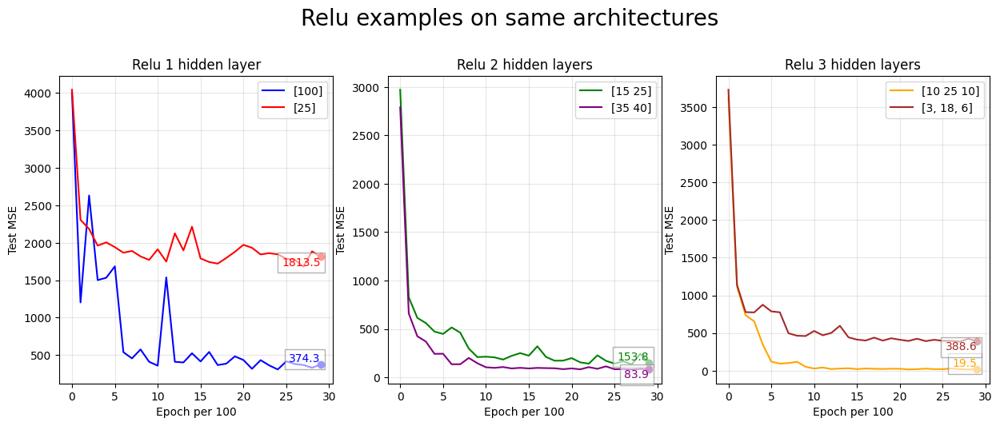

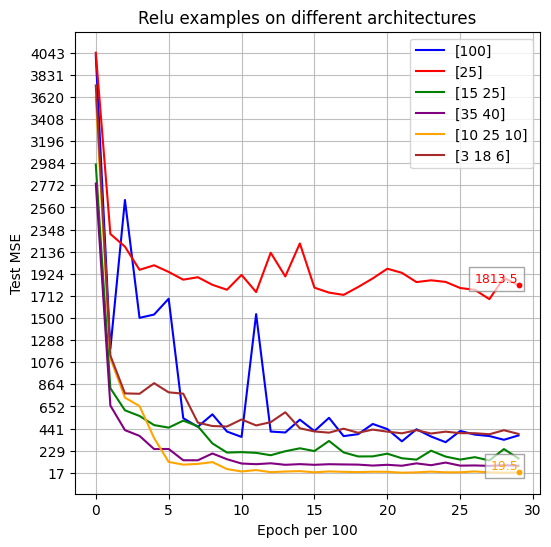

In [21]:
# RELU
test_vectors = [relu1_1_test, relu2_test, relu3_1_test, relu4_1_test, relu5_1_test, relu6_1_test]
colors = ['blue','red','green','purple','orange','brown']
plot_title = 'Relu examples on same architectures'
plot_groups = [
        ([0, 1], "Relu 1 hidden layer"),  
        ([2, 3], "Relu 2 hidden layers"),  
        ([4,5], "Relu 3 hidden layers") 
    ]
plot_analysis(colors, plot_title, test_vectors, plot_groups)

plot_title = 'Relu examples on different architectures'
highlight = [1,4] #zmienić z wynikami 

plot_all_comparison(colors, test_vectors, plot_title, highlight)

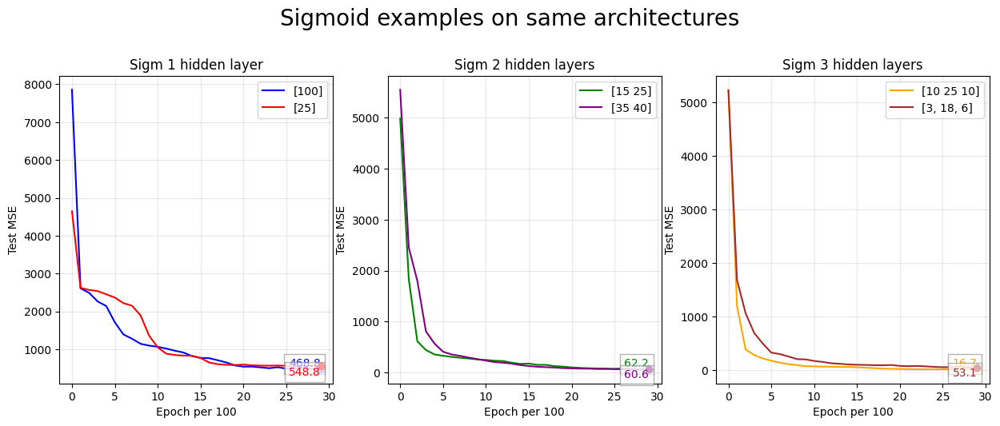

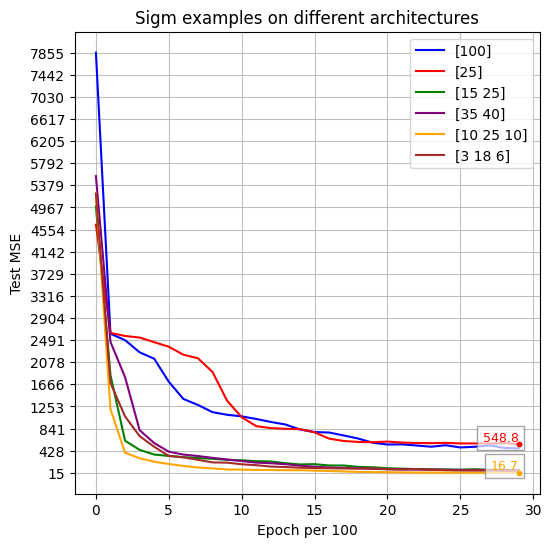

In [23]:
# Sigmoid
test_vectors = [sigm1_1_test, sigm2_test, sigm3_1_test, sigm4_test, sigm5_1_test, sigm6_1_test]
colors = ['blue','red','green','purple','orange','brown']
plot_title = 'Sigmoid examples on same architectures'
plot_groups = [
        ([0, 1], "Sigm 1 hidden layer"),  
        ([2, 3], "Sigm 2 hidden layers"),  
        ([4,5], "Sigm 3 hidden layers") 
    ]
plot_analysis(colors, plot_title, test_vectors, plot_groups)


plot_title = 'Sigm examples on different architectures'
highlight = [1,4] #zmienić z wynikami 

plot_all_comparison(colors, test_vectors, plot_title, highlight)

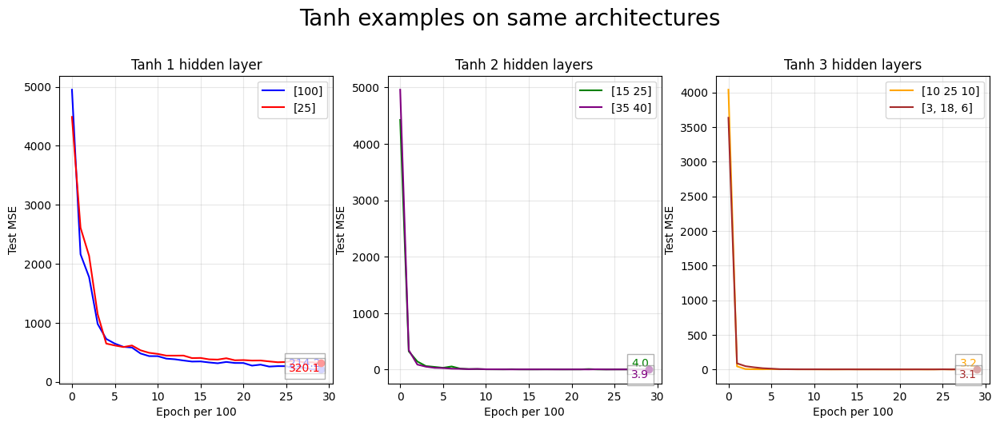

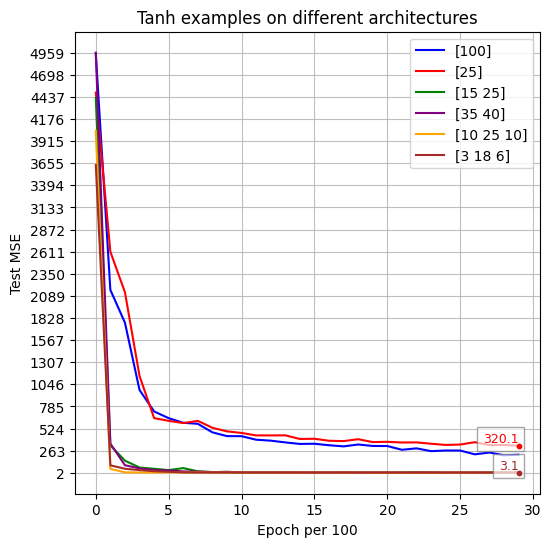

In [26]:
#Tanh
test_vectors = [tanh1_1_test, tanh2_test, tanh3_1_test, tanh4_1_test, tanh5_1_test, tanh6_1_test]
colors = ['blue','red','green','purple','orange','brown']
plot_title = 'Tanh examples on same architectures'
plot_groups = [
        ([0, 1], "Tanh 1 hidden layer"),  
        ([2, 3], "Tanh 2 hidden layers"),  
        ([4,5], "Tanh 3 hidden layers") 
    ]
plot_analysis(colors, plot_title, test_vectors, plot_groups)


plot_title = 'Tanh examples on different architectures'
highlight = [1,5] #zmienić z wynikami 

plot_all_comparison(colors, test_vectors, plot_title, highlight)

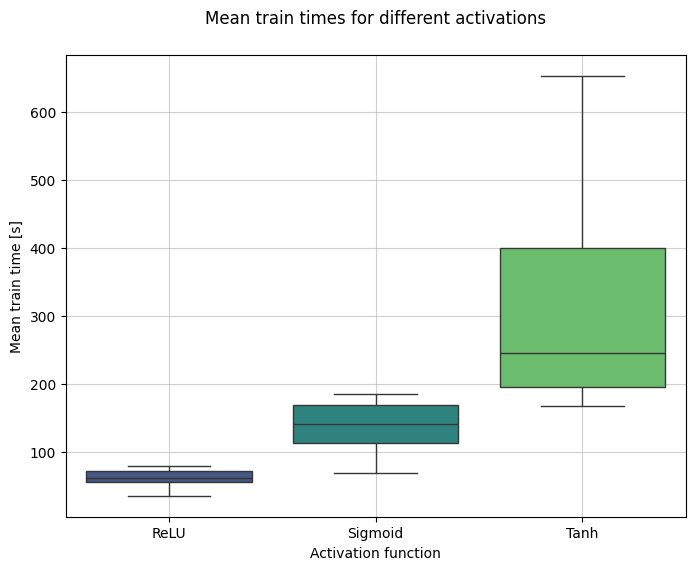

In [37]:
# Time analysis
tanh_times = [
    tanh1_time, tanh1_1_time, tanh2_time, tanh3_time, tanh3_1_time, 
    tanh4_time, tanh4_1_time, tanh5_time, tanh5_1_time, tanh6_time, tanh6_1_time
]

relu_times = [
    relu1_time, relu1_1_time, relu2_time, relu3_time, relu3_1_time, 
    relu4_time, relu4_1_time, relu5_time, relu5_1_time, relu6_time, relu6_1_time
]

sigmoid_times = [
    sigm1_time, sigm1_1_time, sigm2_time, sigm3_time, sigm3_1_time, 
    sigm4_time, sigm4_1_time, sigm5_time, sigm5_1_time, sigm6_time, sigm6_1_time
]

# Dane do wykresu
data = [relu_times, sigmoid_times, tanh_times]
labels = ["ReLU", 'Sigmoid','Tanh']

# Tworzenie wykresu
plt.figure(figsize=(8, 6))
sns.boxplot(data=data, palette="viridis")
plt.xticks(ticks=[0, 1, 2], labels=labels)
plt.xlabel("Activation function")
plt.ylabel("Mean train time [s]")
plt.title("Mean train times for different activations", y=1.05)
plt.grid(alpha=0.6)

**Conclusions**
* Relu is the most unstable - it can differ between architectures and between neuron sizes in hidden layers, mean MSE is larger than best MSE
* Sigmoid and Tanh are more stable and monotonic
* All functions perfomed better for higher lr
* Tanh takes the longest to calculate results
* Tanh performed best on this data

# Part 2 - Steps Large

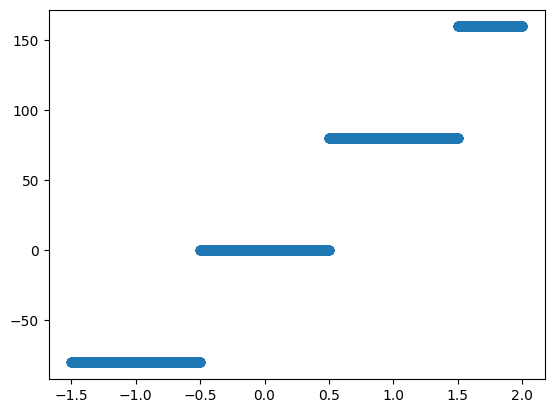

In [2]:
train_df = pd.read_csv('data/steps-large-training.csv')
test_df = pd.read_csv('data/steps-large-test.csv')

X_train, Y_train=train_df['x'].to_numpy().reshape(-1,1), train_df['y'].to_numpy().reshape(-1,1)
X_test, Y_test=test_df['x'].to_numpy().reshape(-1,1), test_df['y'].to_numpy().reshape(-1,1)

x_scaler = MinMaxScaler()
y_scaler = MinMaxScaler()

X_train_normalized = x_scaler.fit_transform(X_train.reshape(-1, 1))
Y_train_normalized = y_scaler.fit_transform(Y_train.reshape(-1, 1))

X_test_normalized = x_scaler.transform(X_test.reshape(-1,1))
Y_test_normalized = y_scaler.transform(Y_test.reshape(-1,1))

plt.scatter(X_train, Y_train)

In [19]:
def train_3_times(layers, activation, init, learning_rate, beta):
    tesT_scores =[]
    final_scores =[]
    times =[]
    best_score = float('inf')
    
    fig,axes = plt.subplots(1,3,figsize=(15,5))
    for y in range(3):  
        nn = NeuralNetwork(layers=layers, activation=activation, optimisation='momentum', beta=beta, weights_initialize=init)

        train, test, final, time, epoch  = nn.train(
            X_train_normalized, Y_train_normalized, X_test_normalized, Y_test,
            learning_rate=learning_rate, batch_size=64, print_frequency=700,
            epochs=3000, loss_func='mse', y_scaler=y_scaler, plot=False
        )
        y_pred = nn.forward(X_test_normalized)
        y_pred_denorm = y_scaler.inverse_transform(y_pred)
        
        tesT_scores.append(np.array(test))
        final_scores.append(final)
        times.append(time)
        if(test[-1]< best_score):
            best_score=test[-1]

        axes[y].scatter(X_test, Y_test, label=f'True data', alpha=0.6)
        axes[y].scatter(X_test, y_pred_denorm, label=f'Predicted data', alpha=0.6)
        axes[y].set_title(f'Trening {y+1}')
        axes[y].set_xlabel('x')
        axes[y].set_ylabel('y')
        axes[y].legend()

    plt.tight_layout() 
    plt.show()


    mean_scores = np.mean(tesT_scores, axis=0)
    mean_time = np.mean(times)
    mean_final_mse = np.mean(final_scores)
    return mean_scores, mean_final_mse, mean_time, best_score

## Relu

INIT INFO : ------------------------------------------------------------------------------------
Selected optimisation method: Momentum
Identity function chosen for last layer
Epoch 0, Training MSE: 0.00755661, Test MSE: 443.6929
Epoch 100, Training MSE: 0.00555553, Test MSE: 319.5199
Epoch 200, Training MSE: 0.00489881, Test MSE: 283.0260
Epoch 300, Training MSE: 0.00401387, Test MSE: 232.4522
Epoch 400, Training MSE: 0.00222436, Test MSE: 129.0325
Epoch 500, Training MSE: 0.00224555, Test MSE: 136.8952
Epoch 600, Training MSE: 0.00162453, Test MSE: 97.7918
Epoch 700, Training MSE: 0.00111546, Test MSE: 63.7547
Epoch 800, Training MSE: 0.00106198, Test MSE: 61.7305
Epoch 900, Training MSE: 0.00094136, Test MSE: 54.0342
Epoch 1000, Training MSE: 0.00097157, Test MSE: 56.5532
Epoch 1100, Training MSE: 0.00078081, Test MSE: 46.8714
Epoch 1200, Training MSE: 0.00114164, Test MSE: 69.6634
Epoch 1300, Training MSE: 0.00088874, Test MSE: 54.6716
Epoch 1400, Training MSE: 0.00068175, Test MSE

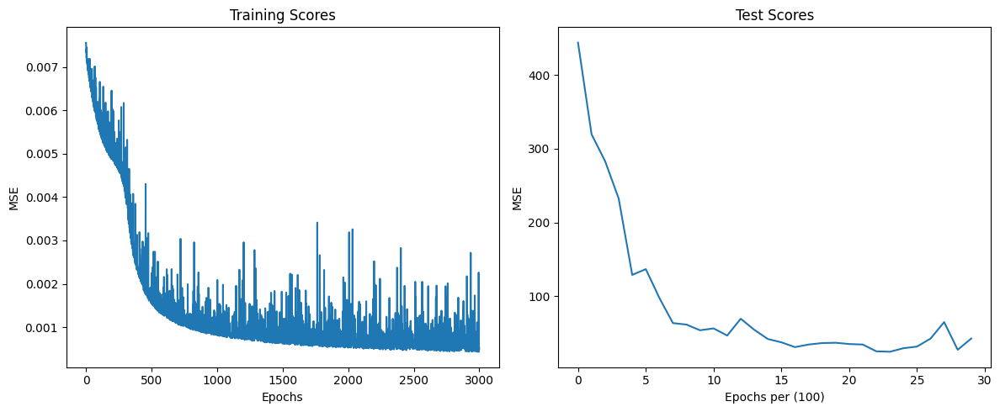

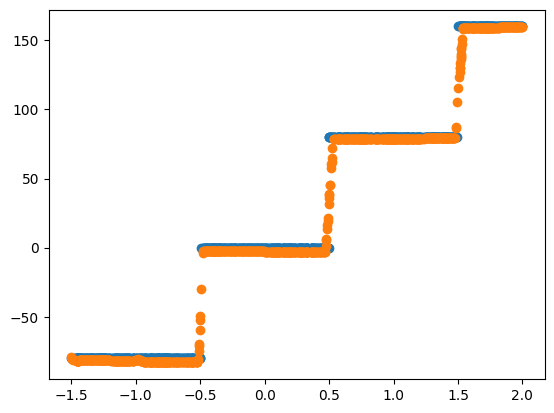

In [11]:
nn1 = NeuralNetwork(layers=[1,35, 40,1], activation='relu', optimisation='momentum', weights_initialize='He')
train, test, final, time, epoch = nn1.train(X_train_normalized, Y_train_normalized, X_test_normalized, Y_test, learning_rate=0.01, loss_func='mse', batch_size=64, epochs=3000, y_scaler=y_scaler, plot=True)
pred = nn1.forward(X_test_normalized)
pred_denorm = y_scaler.inverse_transform(pred)
plt.scatter(X_test, Y_test)
plt.scatter(X_test, pred_denorm)

INIT INFO : ------------------------------------------------------------------------------------
Selected optimisation method: Momentum
Identity function chosen for last layer
Epoch 0, Training MSE: 0.00894759, Test MSE: 536.9855
Epoch 100, Training MSE: 0.00073579, Test MSE: 37.9865
Epoch 200, Training MSE: 0.00097316, Test MSE: 59.1011
Epoch 300, Training MSE: 0.00096562, Test MSE: 46.4330
Epoch 400, Training MSE: 0.00076151, Test MSE: 36.9824
Epoch 500, Training MSE: 0.00117463, Test MSE: 59.5958
Epoch 600, Training MSE: 0.00101723, Test MSE: 62.2156
Epoch 700, Training MSE: 0.00072188, Test MSE: 43.1426
Epoch 800, Training MSE: 0.00131556, Test MSE: 51.7713
Epoch 900, Training MSE: 0.00039280, Test MSE: 16.5612
Epoch 1000, Training MSE: 0.00166373, Test MSE: 113.2723
Epoch 1100, Training MSE: 0.00094091, Test MSE: 72.9846
Epoch 1200, Training MSE: 0.00098207, Test MSE: 45.1442
Epoch 1300, Training MSE: 0.00083020, Test MSE: 28.9931
Epoch 1400, Training MSE: 0.00045962, Test MSE: 28

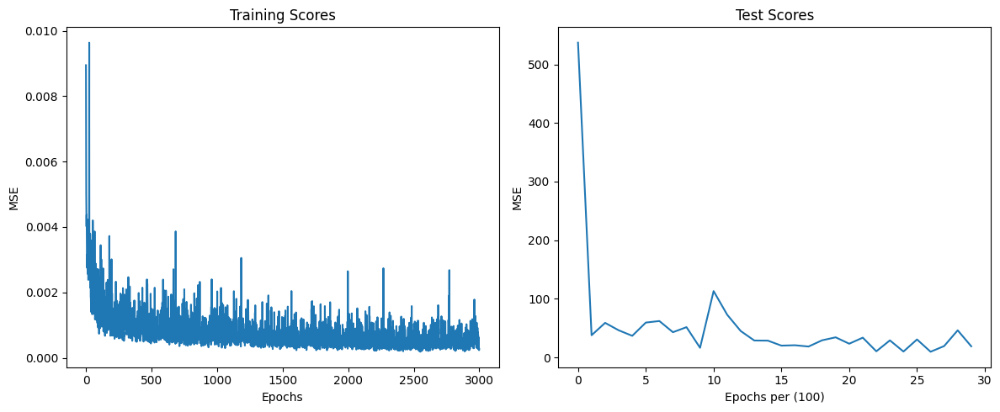

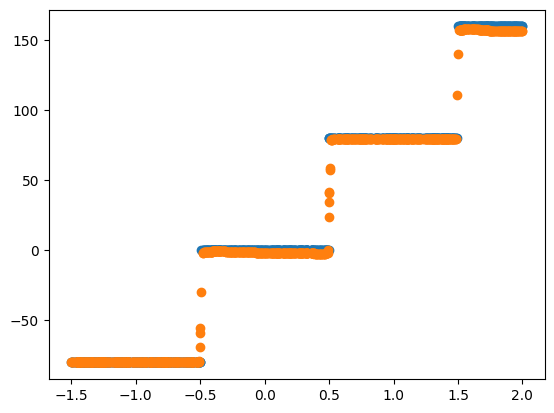

In [13]:
nn1 = NeuralNetwork(layers=[1,45,50, 45,1], activation='relu', optimisation='momentum', beta=0.99, weights_initialize='He')
train, test, final, time, epoch = nn1.train(X_train_normalized, Y_train_normalized, X_test_normalized, Y_test, learning_rate=0.03, loss_func='mse', batch_size=64, epochs=3000, y_scaler=y_scaler, plot=True)
pred = nn1.forward(X_test_normalized)
pred_denorm = y_scaler.inverse_transform(pred)
plt.scatter(X_test, Y_test)
plt.scatter(X_test, pred_denorm)

INIT INFO : ------------------------------------------------------------------------------------
Selected optimisation method: Momentum
Identity function chosen for last layer
Epoch 0, Training MSE: 0.01626036, Test MSE: 913.8744
Epoch 700, Training MSE: 0.00056627, Test MSE: 23.6547
Epoch 1400, Training MSE: 0.00085417, Test MSE: 29.0663
Epoch 2100, Training MSE: 0.00043853, Test MSE: 24.0714
Epoch 2800, Training MSE: 0.00090526, Test MSE: 34.3152
Training Duration: 204.40996885299683
INIT INFO : ------------------------------------------------------------------------------------
Selected optimisation method: Momentum
Identity function chosen for last layer
Epoch 0, Training MSE: 0.00880527, Test MSE: 520.5852
Epoch 700, Training MSE: 0.00206008, Test MSE: 103.9868
Epoch 1400, Training MSE: 0.00057168, Test MSE: 34.3401
Epoch 2100, Training MSE: 0.00057273, Test MSE: 19.4062
Epoch 2800, Training MSE: 0.00031739, Test MSE: 13.3963
Training Duration: 207.16333174705505
INIT INFO : -----

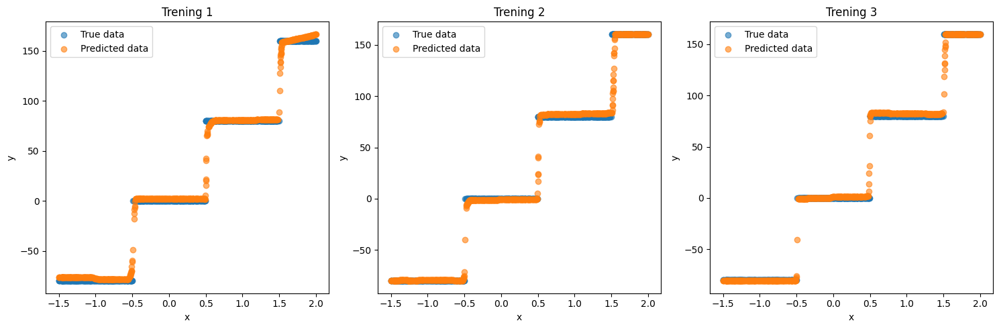

In [20]:
relu_test, relu_final, relu_time, relu_best = train_3_times(layers=[1,55,70,55,1], activation='relu', init='He', beta=0.99, learning_rate=0.02)

## Sigmoid

INIT INFO : ------------------------------------------------------------------------------------
Selected optimisation method: Momentum
Identity function chosen for last layer
Epoch 0, Training MSE: 0.11875969, Test MSE: 6911.0561
Epoch 100, Training MSE: 0.00994536, Test MSE: 569.8061
Epoch 200, Training MSE: 0.00825224, Test MSE: 478.5356
Epoch 300, Training MSE: 0.00720496, Test MSE: 416.2091
Epoch 400, Training MSE: 0.00634549, Test MSE: 361.6145
Epoch 500, Training MSE: 0.00696061, Test MSE: 397.0743
Epoch 600, Training MSE: 0.00546279, Test MSE: 316.3229
Epoch 700, Training MSE: 0.00298413, Test MSE: 172.4579
Epoch 800, Training MSE: 0.00223127, Test MSE: 122.9881
Epoch 900, Training MSE: 0.00197771, Test MSE: 110.7294
Epoch 1000, Training MSE: 0.00176948, Test MSE: 97.3927
Epoch 1100, Training MSE: 0.00161951, Test MSE: 94.7635
Epoch 1200, Training MSE: 0.00148770, Test MSE: 87.2147
Epoch 1300, Training MSE: 0.00137622, Test MSE: 79.5295
Epoch 1400, Training MSE: 0.00130465, Tes

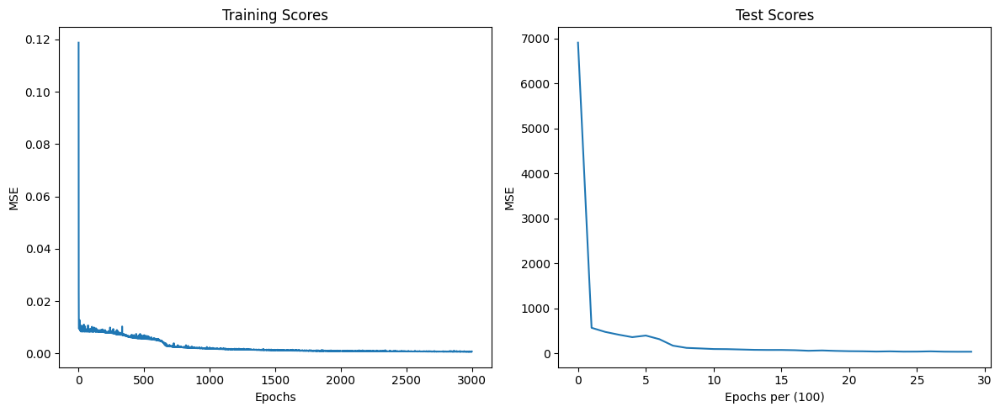

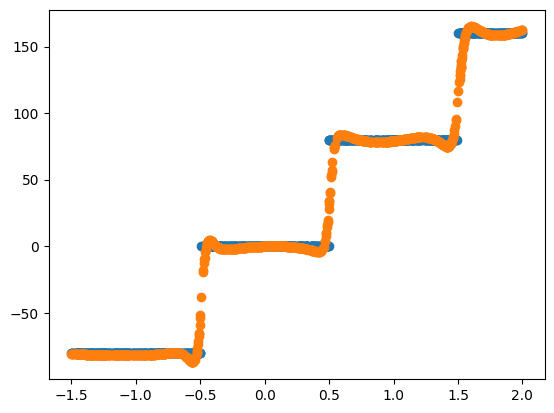

In [22]:
nn2 = NeuralNetwork(layers=[1,30,45,30,1], activation='sigmoid', optimisation='momentum', weights_initialize='Xavier')
train, test, final, time, epoch = nn2.train(X_train_normalized, Y_train_normalized, X_test_normalized, Y_test, learning_rate=0.2, loss_func='mse', batch_size=64, epochs=3000, y_scaler=y_scaler, plot=True)
pred = nn2.forward(X_test_normalized)
pred_denorm = y_scaler.inverse_transform(pred)
plt.scatter(X_test, Y_test)
plt.scatter(X_test, pred_denorm)

In [31]:
nn2 = NeuralNetwork(layers=[1,25,50,25,1], activation='sigmoid', optimisation='momentum', weights_initialize='Xavier', beta=0.99)
train, test, final, time, epoch = nn2.train(X_train_normalized, Y_train_normalized, X_test_normalized, Y_test, learning_rate=0.15, loss_func='mse', batch_size=64, epochs=3000, y_scaler=y_scaler, plot=True)
pred = nn2.forward(X_test_normalized)
pred_denorm = y_scaler.inverse_transform(pred)
plt.scatter(X_test, Y_test)
plt.scatter(X_test, pred_denorm)

INIT INFO : ------------------------------------------------------------------------------------
Selected optimisation method: Momentum
Identity function chosen for last layer
Epoch 0, Training MSE: 0.12549945, Test MSE: 7266.8242
Epoch 100, Training MSE: 0.11982258, Test MSE: 6963.5476
Epoch 200, Training MSE: 0.14952395, Test MSE: 8702.3986
Epoch 300, Training MSE: 0.12488558, Test MSE: 7232.2185


KeyboardInterrupt: 

## Tanh

INIT INFO : ------------------------------------------------------------------------------------
Selected optimisation method: Momentum
Identity function chosen for last layer
Epoch 0, Training MSE: 0.00893800, Test MSE: 525.8652
Epoch 100, Training MSE: 0.00837987, Test MSE: 489.6033
Epoch 200, Training MSE: 0.00856088, Test MSE: 497.0223
Epoch 300, Training MSE: 0.00830762, Test MSE: 485.8163
Epoch 400, Training MSE: 0.00809591, Test MSE: 478.0443
Epoch 500, Training MSE: 0.00488032, Test MSE: 295.0790
Epoch 600, Training MSE: 0.00234893, Test MSE: 136.4726
Epoch 700, Training MSE: 0.00178663, Test MSE: 93.9098
Epoch 800, Training MSE: 0.00129726, Test MSE: 69.9640
Epoch 900, Training MSE: 0.00104364, Test MSE: 57.7179
Epoch 1000, Training MSE: 0.00096772, Test MSE: 52.1277
Epoch 1100, Training MSE: 0.00101628, Test MSE: 48.0726
Epoch 1200, Training MSE: 0.00093151, Test MSE: 43.5304
Epoch 1300, Training MSE: 0.00077763, Test MSE: 36.6954
Epoch 1400, Training MSE: 0.00070468, Test MS

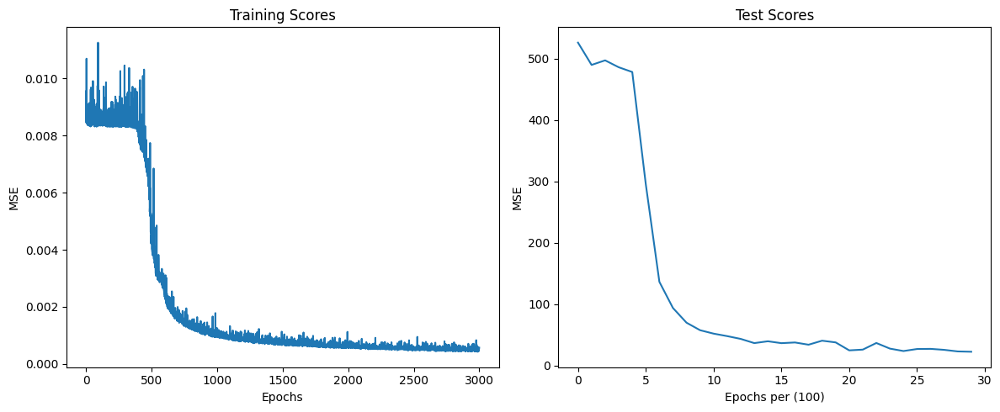

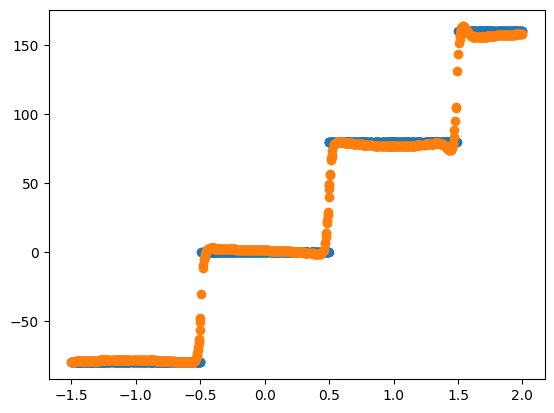

In [36]:
nn3 = NeuralNetwork(layers=[1,25,35,1], activation='tanh', optimisation='momentum', weights_initialize='Xavier', beta=0.9)
train, test, final, time, epoch = nn3.train(X_train_normalized, Y_train_normalized, X_test_normalized, Y_test, learning_rate=0.2, loss_func='mse', batch_size=64, epochs=3000, y_scaler=y_scaler, plot=True)
pred = nn3.forward(X_test_normalized)
pred_denorm = y_scaler.inverse_transform(pred)
plt.scatter(X_test, Y_test)
plt.scatter(X_test, pred_denorm)

INIT INFO : ------------------------------------------------------------------------------------
Selected optimisation method: Momentum
Identity function chosen for last layer
Epoch 0, Training MSE: 0.00870305, Test MSE: 504.7848
Epoch 100, Training MSE: 0.00784049, Test MSE: 454.4079
Epoch 200, Training MSE: 0.00158646, Test MSE: 73.4199
Epoch 300, Training MSE: 0.00077094, Test MSE: 42.9048
Epoch 400, Training MSE: 0.00095781, Test MSE: 43.3903
Epoch 500, Training MSE: 0.00088055, Test MSE: 47.8208
Epoch 600, Training MSE: 0.00054958, Test MSE: 23.5693
Epoch 700, Training MSE: 0.00075658, Test MSE: 55.2577
Epoch 800, Training MSE: 0.00050188, Test MSE: 18.5253
Epoch 900, Training MSE: 0.00042746, Test MSE: 22.1224
Epoch 1000, Training MSE: 0.00036684, Test MSE: 21.0173
Epoch 1100, Training MSE: 0.00045000, Test MSE: 14.9611
Epoch 1200, Training MSE: 0.00058408, Test MSE: 35.2355
Epoch 1300, Training MSE: 0.00053021, Test MSE: 35.3288
Epoch 1400, Training MSE: 0.00037551, Test MSE: 19

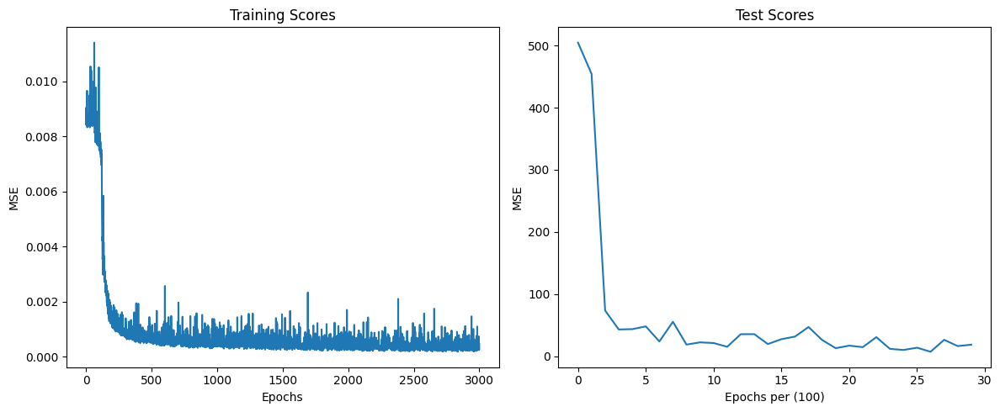

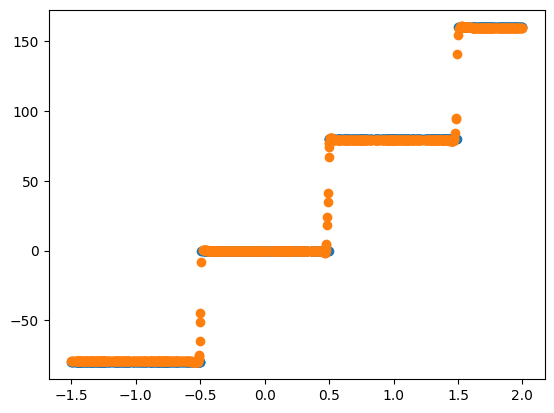

In [ ]:
nn3 = NeuralNetwork(layers=[1,15,25,35,1], activation='tanh', optimisation='momentum', weights_initialize='Xavier', beta=0.9)
train, test, final, time, epoch = nn3.train(X_train_normalized, Y_train_normalized, X_test_normalized, Y_test, learning_rate=0.2, loss_func='mse', batch_size=64, epochs=3000, y_scaler=y_scaler, plot=True)
pred = nn3.forward(X_test_normalized)
pred_denorm = y_scaler.inverse_transform(pred)
plt.scatter(X_test, Y_test)
plt.scatter(X_test, pred_denorm)
#similar results as relu

INIT INFO : ------------------------------------------------------------------------------------
Selected optimisation method: Momentum
Identity function chosen for last layer
Epoch 0, Training MSE: 0.00863052, Test MSE: 507.7570
Epoch 700, Training MSE: 0.00036611, Test MSE: 15.5737
Epoch 1400, Training MSE: 0.00038703, Test MSE: 23.0168
Epoch 2100, Training MSE: 0.00041384, Test MSE: 27.7205
Epoch 2800, Training MSE: 0.00024218, Test MSE: 15.8129
Training Duration: 393.1188020706177
INIT INFO : ------------------------------------------------------------------------------------
Selected optimisation method: Momentum
Identity function chosen for last layer
Epoch 0, Training MSE: 0.01271162, Test MSE: 725.2730
Epoch 700, Training MSE: 0.00069517, Test MSE: 48.8319
Epoch 1400, Training MSE: 0.00037849, Test MSE: 21.0230
Epoch 2100, Training MSE: 0.00040589, Test MSE: 13.3822
Epoch 2800, Training MSE: 0.00045972, Test MSE: 30.2946
Training Duration: 387.6561076641083
INIT INFO : --------

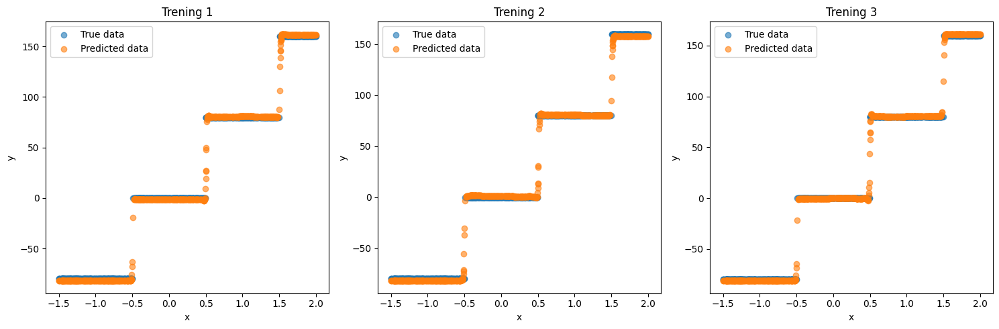

In [40]:
tanh_test, tanh_final, tanh_time, tanh_best = train_3_times(layers=[1,15,25,35,1], activation='tanh', init='Xavier', beta=0.9, learning_rate=0.2)

## Results

In [42]:
df = pd.DataFrame({
    'Activation' :['Tanh', 'Relu'],
    'Layers': ['15 25 35', '35 40'],
    'Mean Time': [tanh_time, relu_time],
    'Mean MSE': [tanh_final, relu_final],
    'Best achieved MSE' : [tanh_best, relu_best]
})
df

,Activation,Layers,Mean Time,Mean MSE,Best achieved MSE
0,Tanh,15 25 35,390.280818,10.807603,8.972291
1,Relu,35 40,206.657455,37.803208,22.848633


Tanh once again performs better but slower

Text(0.5, 1.0, 'Relu vs Tanh activation on steps data')

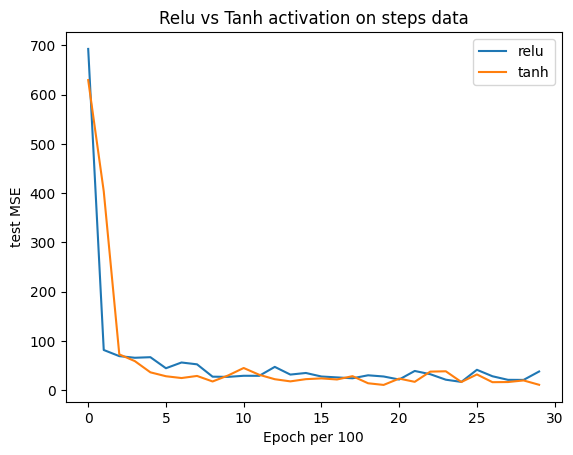

In [45]:
plt.plot(np.arange(len(relu_test)), relu_test, label='relu')
plt.plot(np.arange(len(tanh_test)), tanh_test, label='tanh')
plt.legend()
plt.xlabel('Epoch per 100')
plt.ylabel('test MSE')
plt.title('Relu vs Tanh activation on steps data')

# Part 3 - rings 3

In [64]:
train_df = pd.read_csv('data/rings3-regular-training.csv')
test_df = pd.read_csv('data/rings3-regular-test.csv')

X_train = train_df[['x', 'y']].to_numpy()
Y_train = train_df['c'].to_numpy().reshape(-1,1)  
X_test = test_df[['x', 'y']].to_numpy()
Y_test = test_df['c'].to_numpy().reshape(-1,1)  

# # Kodowanie one-hot dla Y
y_encoder = OneHotEncoder(sparse_output=False)
Y_train_encoded = y_encoder.fit_transform(Y_train)  
Y_test_encoded = y_encoder.transform(Y_test) 

print(f'Number of classes: {train_df["c"].nunique()}')

Number of classes: 3


In [34]:
def train_5_times_classif(layers, activation,last_activation, init, learning_rate):
    tesT_scores =[]
    final_scores =[]
    times =[]
    best_score = -float('inf')
    all_plots_data=[]
    f1_scores =[]
    for y in range(5):  
        nn = NeuralNetwork(layers=layers, activation=activation, last_layer_activation=last_activation, weights_initialize=init)

        train, test, final, time, epoch  = nn.train(X_train, Y_train_encoded, X_test, Y_test_encoded,loss_func='F1',  learning_rate=learning_rate, epochs=3000, report_frequency=10, print_frequency=700)
        
        tesT_scores.append(np.array(test))
        final_scores.append(final)
        times.append(time)
        f1_scores.append(final)
        if(test[-1]> best_score):
            best_score=test[-1]
        
        y_pred_probs = nn.forward(X_test)  # Macierz (n_samples, n_classes)
        y_pred_classes = np.argmax(y_pred_probs, axis=1)
        y_test_classes = Y_test.ravel()
        correct = y_test_classes == y_pred_classes

        all_plots_data.append({
            'x': X_test[:, 0],
            'y': X_test[:, 1],
            'class': y_test_classes,
            'correct': correct
        })
    

    mean_scores = np.mean(tesT_scores, axis=0)
    mean_time = np.mean(times)
    mean_final_mse = np.mean(final_scores)

    fig, axes = plt.subplots(1, 5, figsize=(20, 5))
    
    for y, (plot_data, f1) in enumerate(zip(all_plots_data, f1_scores)):
        df_plot = pd.DataFrame({
            'x': plot_data['x'],
            'y': plot_data['y'],
            'class': plot_data['class'],
            'correct': plot_data['correct']
        })
        df_plot['class'] = df_plot['class'].astype('category')

        # Wykres poprawnych klasyfikacji
        sns.scatterplot(
            data=df_plot[df_plot['correct']],
            x='x', y='y',
            hue='class', palette="viridis",
            edgecolor='k', legend=False,
            ax=axes[y]
        )

        # Wykres błędnych klasyfikacji
        sns.scatterplot(
            data=df_plot[~df_plot['correct']],
            x='x', y='y',
            color='red',
            edgecolor='k',
            label="Incorrect",
            ax=axes[y]
        )

        # Ustaw tytuł z wynikiem F1, zaokrąglony do 4 miejsc po przecinku
        axes[y].set_title(f'Iteration {y+1}: F1 = {f1:.4f}')
        axes[y].set_xlabel('X')
        axes[y].set_ylabel('Y')
    
    plt.tight_layout()
    plt.show()



    return mean_scores, mean_final_mse, mean_time, best_score

## Softmax

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 1.11013404, Test F1: 0.2201
Epoch 100, Training F1: 0.45323215, Test F1: 0.8565
Epoch 200, Training F1: 0.44108040, Test F1: 0.7896
Epoch 300, Training F1: 0.39809660, Test F1: 0.8300
Epoch 400, Training F1: 0.27765796, Test F1: 0.8866
Epoch 500, Training F1: 0.40502314, Test F1: 0.7982
Epoch 600, Training F1: 0.30243151, Test F1: 0.8579
Epoch 700, Training F1: 0.26574137, Test F1: 0.8701
Epoch 800, Training F1: 0.17357043, Test F1: 0.9475
Epoch 900, Training F1: 0.22067056, Test F1: 0.8913
Training Duration: 4.4948320388793945


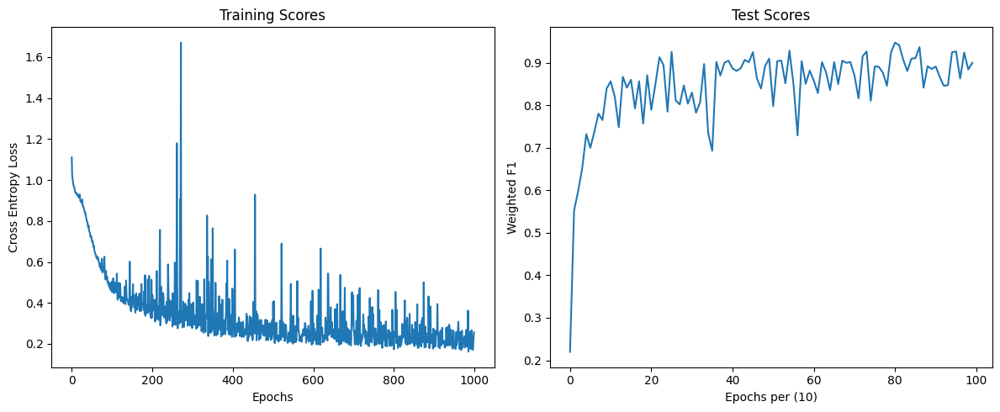

In [54]:
nn = NeuralNetwork(layers=[2, 4,8,4, 3], activation="relu", last_layer_activation='softmax')
soft1_train, soft1_test,soft1_final, soft1_time, soft1_epoch = nn.train(X_train, Y_train_encoded, X_test, Y_test_encoded,loss_func='F1',  learning_rate=0.01, epochs=1000, report_frequency=10, loss_threshold=1.9)

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 0.98906456, Test F1: 0.5547
Epoch 700, Training F1: 0.29799760, Test F1: 0.8657
Epoch 1400, Training F1: 0.20973422, Test F1: 0.9045
Epoch 2100, Training F1: 0.16960177, Test F1: 0.9029
Epoch 2800, Training F1: 0.20868826, Test F1: 0.8939
Training Duration: 13.848783493041992


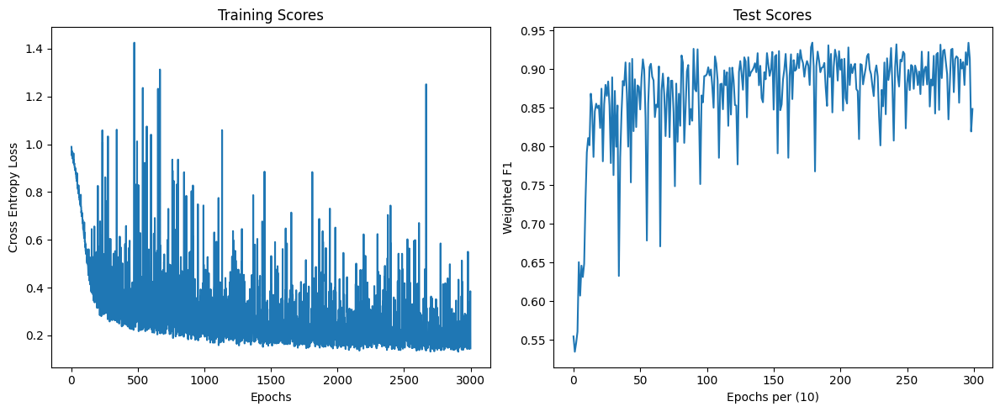

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 1.09177398, Test F1: 0.2825
Epoch 700, Training F1: 0.20811554, Test F1: 0.9205
Epoch 1400, Training F1: 0.21050964, Test F1: 0.9211
Epoch 2100, Training F1: 0.14616782, Test F1: 0.9368
Epoch 2800, Training F1: 0.13068321, Test F1: 0.9475
Training Duration: 14.170407056808472


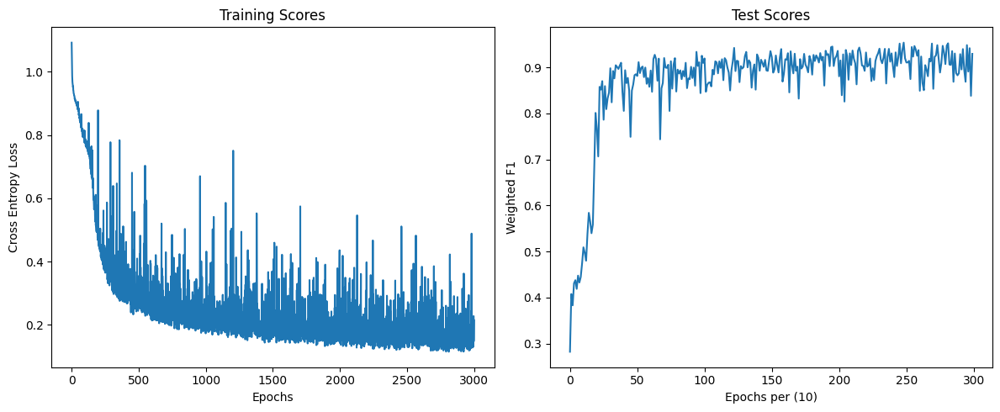

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 1.00750355, Test F1: 0.3550
Epoch 700, Training F1: 0.24592326, Test F1: 0.8728
Epoch 1400, Training F1: 0.19172838, Test F1: 0.9085
Epoch 2100, Training F1: 0.20145667, Test F1: 0.9001
Epoch 2800, Training F1: 0.20537181, Test F1: 0.9069
Training Duration: 14.307140588760376


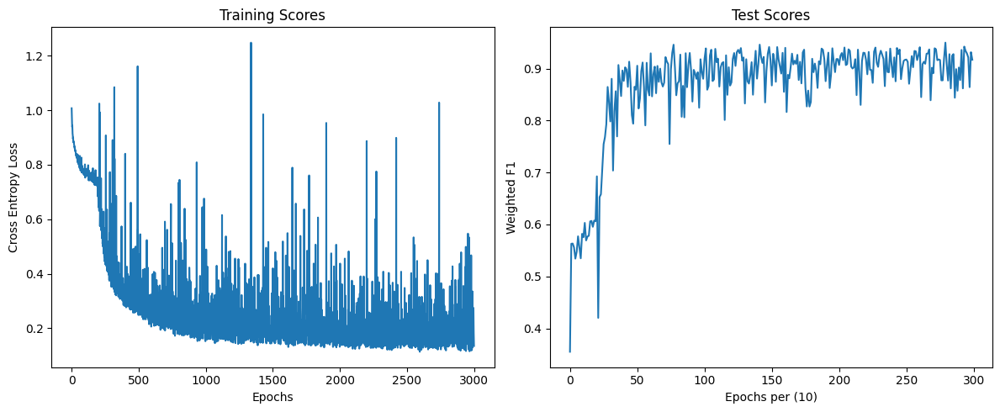

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 1.08992465, Test F1: 0.2702
Epoch 700, Training F1: 0.27535721, Test F1: 0.9155
Epoch 1400, Training F1: 0.22157995, Test F1: 0.9001
Epoch 2100, Training F1: 0.17364596, Test F1: 0.9307
Epoch 2800, Training F1: 0.18116529, Test F1: 0.9270
Training Duration: 14.270902872085571


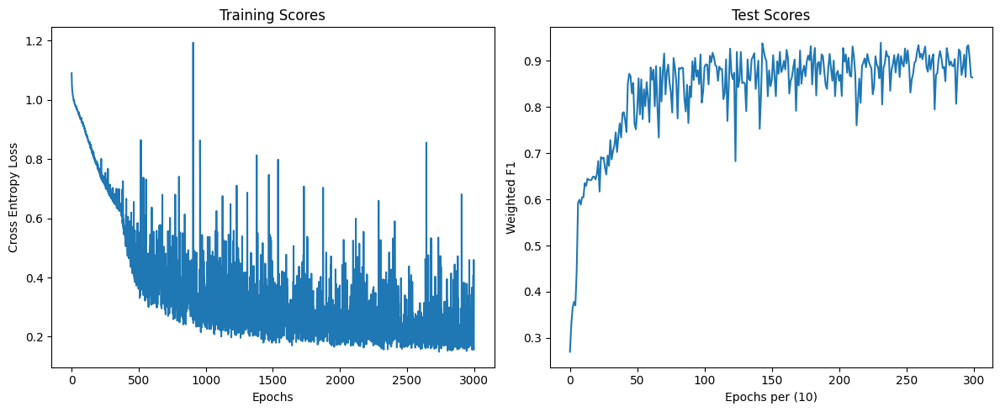

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 0.97363061, Test F1: 0.4722
Epoch 700, Training F1: 0.28287092, Test F1: 0.8719
Epoch 1400, Training F1: 0.16601681, Test F1: 0.9247
Epoch 2100, Training F1: 0.24565194, Test F1: 0.9002
Epoch 2800, Training F1: 0.17122564, Test F1: 0.9241
Training Duration: 15.595028162002563


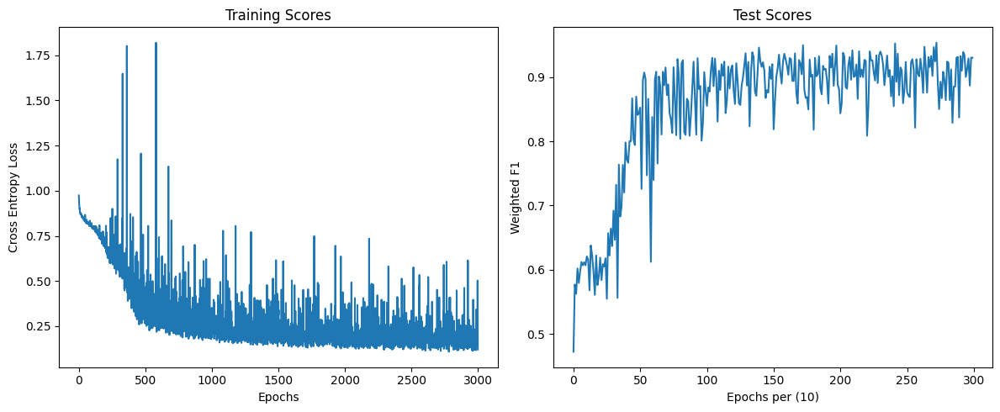

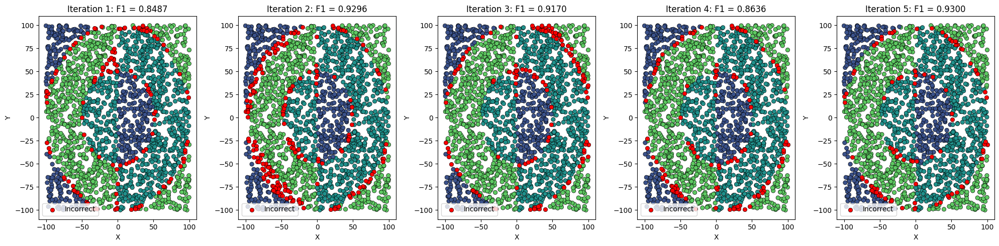

In [91]:
softmax_test, softmax_final, softmax_time, softmax_best = train_5_times_classif(layers=[2, 4,8,4, 3], activation="relu", last_activation='softmax', learning_rate=0.01, init=None)

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 1.08085557, Test F1: 0.4153
Epoch 700, Training F1: 0.29787285, Test F1: 0.8386
Epoch 1400, Training F1: 0.13728129, Test F1: 0.9261
Epoch 2100, Training F1: 0.17123107, Test F1: 0.9057
Epoch 2800, Training F1: 0.08655320, Test F1: 0.9470
Training Duration: 30.680488109588623


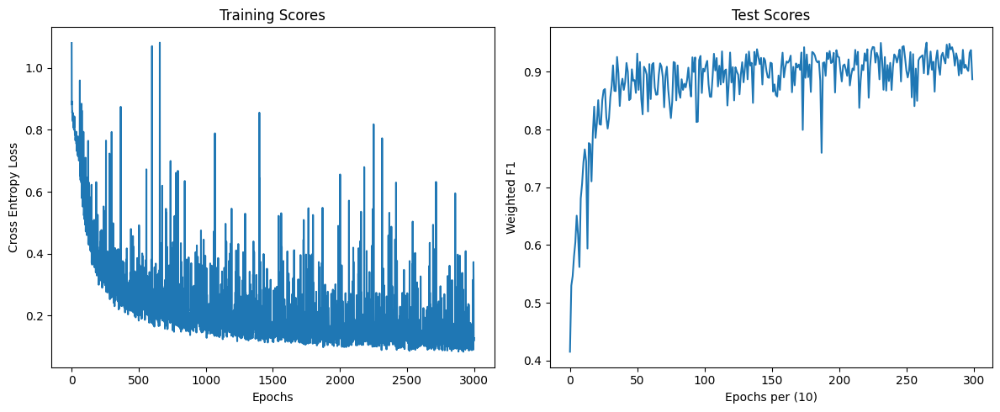

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 0.98952629, Test F1: 0.4696
Epoch 700, Training F1: 0.39937643, Test F1: 0.7868
Epoch 1400, Training F1: 0.25714267, Test F1: 0.8710
Epoch 2100, Training F1: 0.38923122, Test F1: 0.8476
Epoch 2800, Training F1: 0.13791840, Test F1: 0.9187
Training Duration: 33.72928047180176


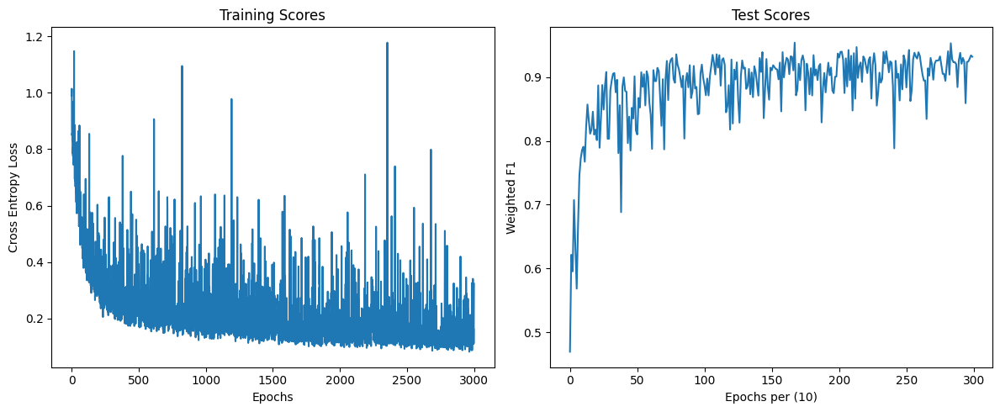

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 0.97188727, Test F1: 0.5271
Epoch 700, Training F1: 0.26692759, Test F1: 0.8607
Epoch 1400, Training F1: 0.18591342, Test F1: 0.8964
Epoch 2100, Training F1: 0.11543486, Test F1: 0.9380
Epoch 2800, Training F1: 0.14824688, Test F1: 0.9205
Training Duration: 33.23069524765015


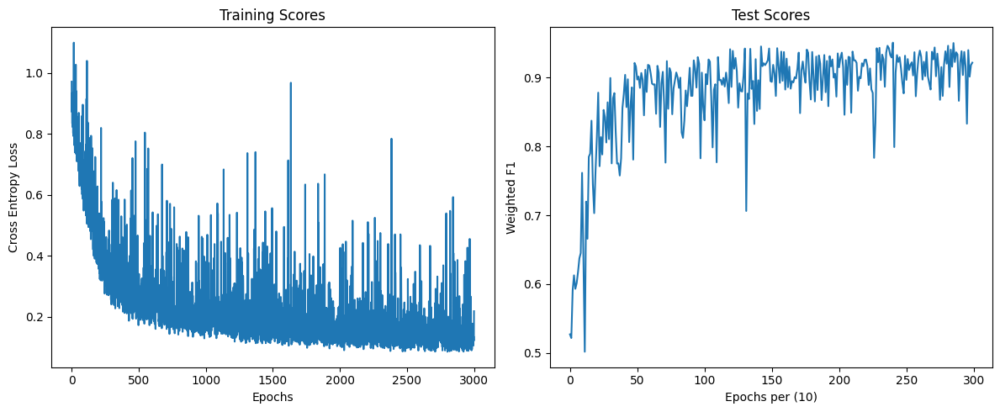

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 0.93906931, Test F1: 0.4989
Epoch 700, Training F1: 0.30424940, Test F1: 0.8597
Epoch 1400, Training F1: 0.20471098, Test F1: 0.8902
Epoch 2100, Training F1: 0.10802594, Test F1: 0.9391
Epoch 2800, Training F1: 0.12449626, Test F1: 0.9273
Training Duration: 33.609652280807495


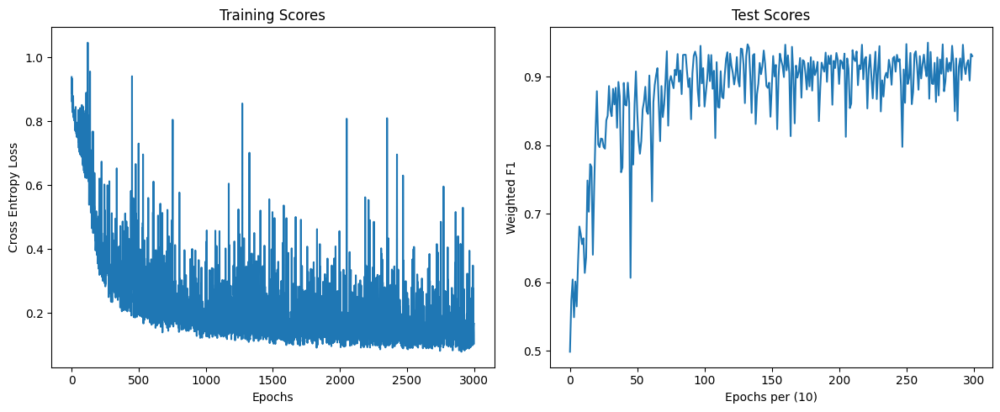

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 0.93968094, Test F1: 0.5161
Epoch 700, Training F1: 0.36148427, Test F1: 0.8423
Epoch 1400, Training F1: 0.12578644, Test F1: 0.9303
Epoch 2100, Training F1: 0.21235937, Test F1: 0.9037
Epoch 2800, Training F1: 0.09497771, Test F1: 0.9399
Training Duration: 33.047762870788574


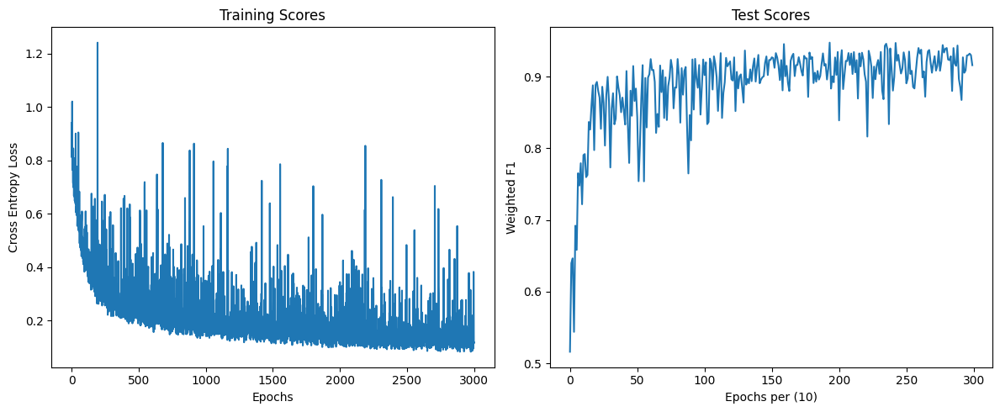

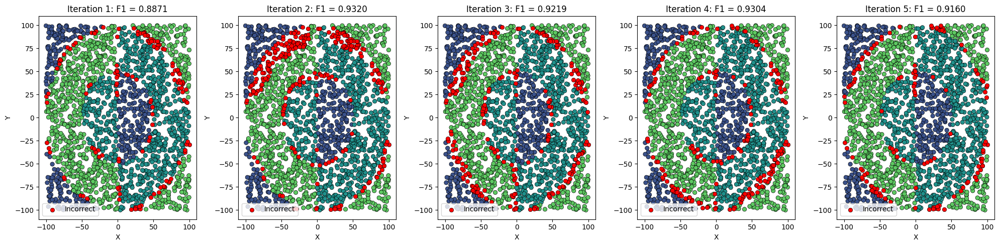

In [92]:
soft2_test, soft2_final, soft2_time, soft2_best = train_5_times_classif(layers=[2, 32,64,32, 3], activation="relu", last_activation='softmax', learning_rate=0.01, init=None)

## Sigmoid

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
sigmoid function chosen for last layer.
Epoch 0, Training F1: 0.78224006, Test F1: 0.0716
Epoch 700, Training F1: 0.97516392, Test F1: 0.5148
Epoch 1400, Training F1: 0.93175215, Test F1: 0.3867
Epoch 2100, Training F1: 0.80873017, Test F1: 0.4972
Epoch 2800, Training F1: 0.74802342, Test F1: 0.6366
Training Duration: 18.256182193756104


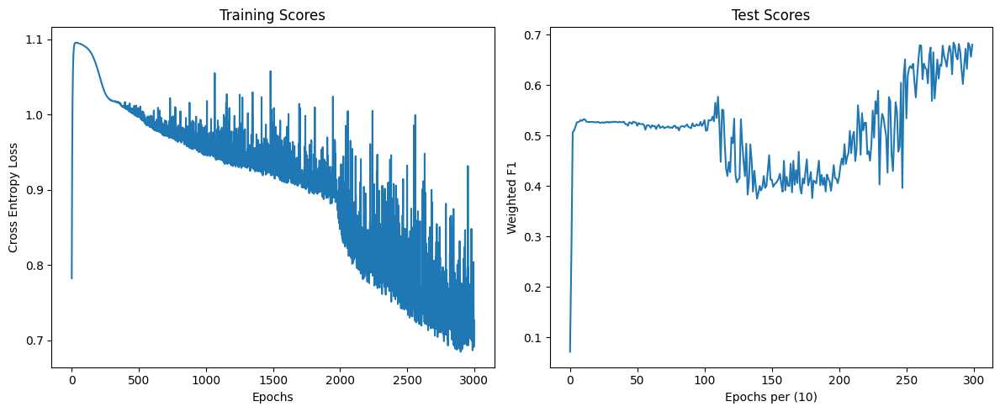

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
sigmoid function chosen for last layer.
Epoch 0, Training F1: 0.83239350, Test F1: 0.2360
Epoch 700, Training F1: 0.97646112, Test F1: 0.5197
Epoch 1400, Training F1: 0.95762146, Test F1: 0.4752
Epoch 2100, Training F1: 0.82558171, Test F1: 0.7010
Epoch 2800, Training F1: 0.69212785, Test F1: 0.6244
Training Duration: 20.158401489257812


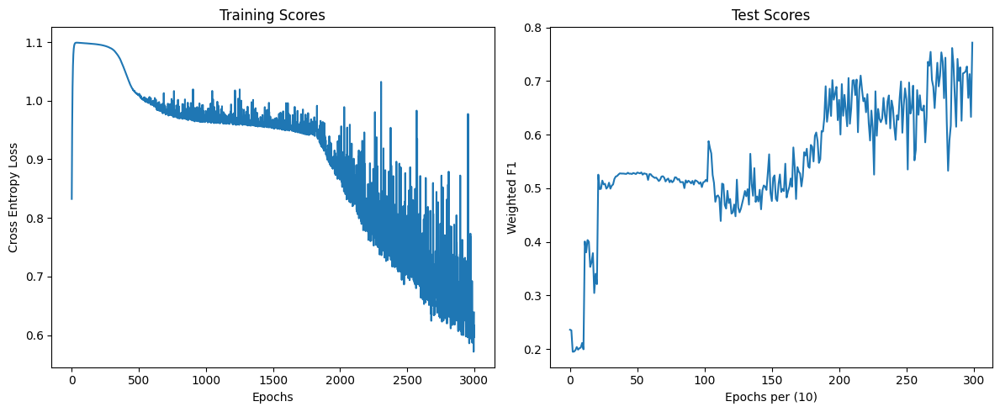

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
sigmoid function chosen for last layer.
Epoch 0, Training F1: 0.83808946, Test F1: 0.2136
Epoch 700, Training F1: 1.08986844, Test F1: 0.2955
Epoch 1400, Training F1: 0.98007131, Test F1: 0.5182
Epoch 2100, Training F1: 0.86119313, Test F1: 0.5092
Epoch 2800, Training F1: 0.77182041, Test F1: 0.6040
Training Duration: 19.525402069091797


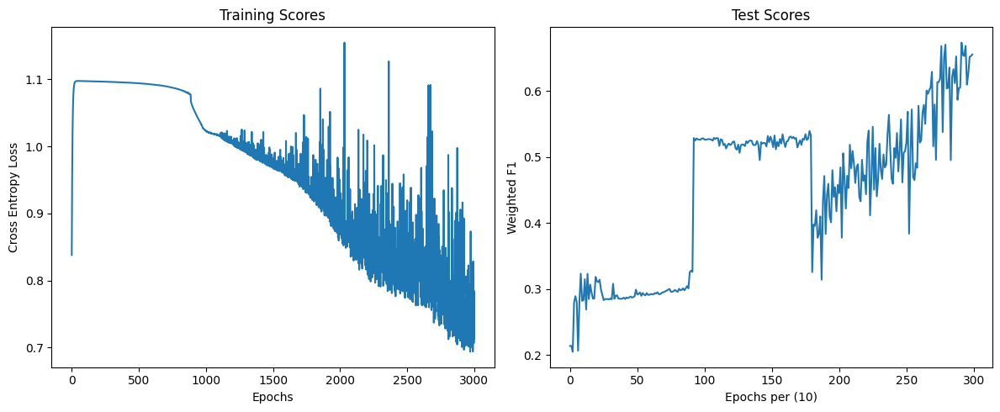

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
sigmoid function chosen for last layer.
Epoch 0, Training F1: 0.74129106, Test F1: 0.0716
Epoch 700, Training F1: 0.97681223, Test F1: 0.5214
Epoch 1400, Training F1: 0.94825715, Test F1: 0.3920
Epoch 2100, Training F1: 0.89729230, Test F1: 0.3910
Epoch 2800, Training F1: 0.79143342, Test F1: 0.6132
Training Duration: 20.035565853118896


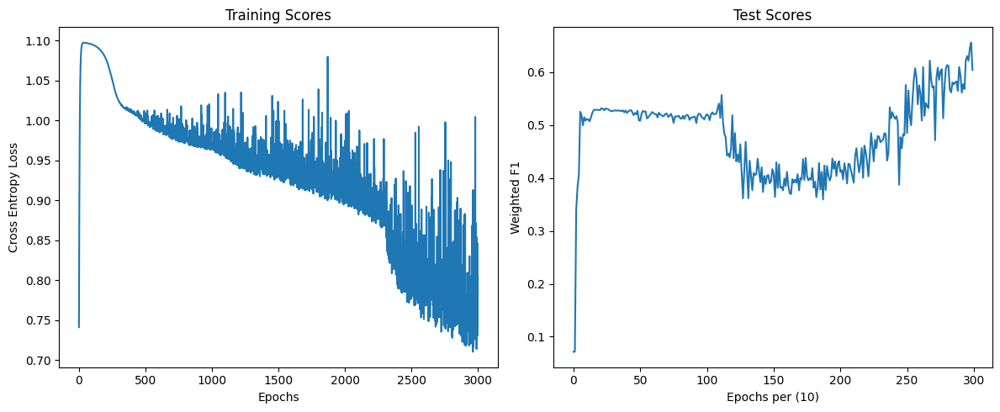

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
sigmoid function chosen for last layer.
Epoch 0, Training F1: 0.61769271, Test F1: 0.0716
Epoch 700, Training F1: 0.98966661, Test F1: 0.5226
Epoch 1400, Training F1: 0.94709953, Test F1: 0.5281
Epoch 2100, Training F1: 0.92107894, Test F1: 0.5399
Epoch 2800, Training F1: 0.86853063, Test F1: 0.6484
Training Duration: 19.636929750442505


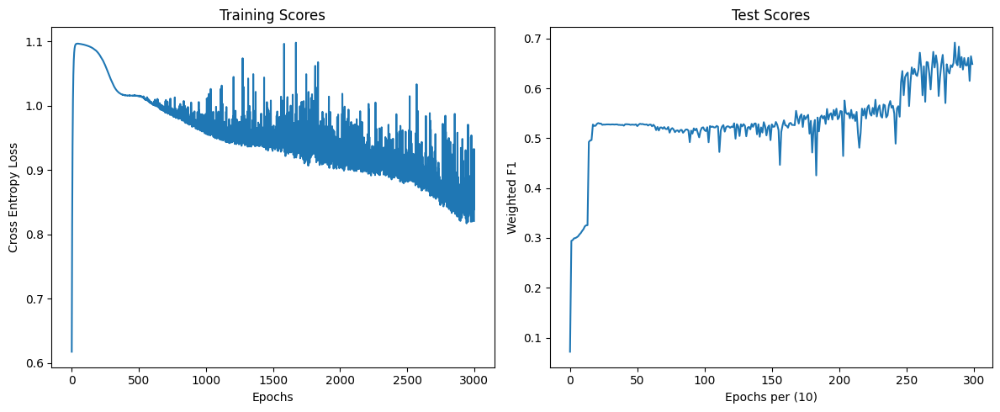

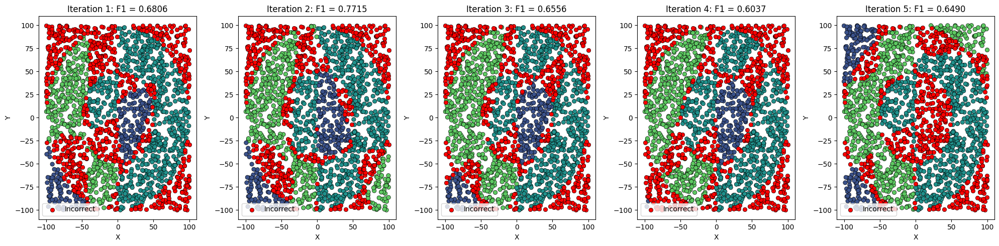

In [93]:
sigm_test, sigm_final, sigm_time, sigm_best = train_5_times_classif(layers=[2, 4,8,4, 3], activation="sigmoid", last_activation='sigmoid', learning_rate=0.01, init=None)

Architecture too easy for sigmoid

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
sigmoid function chosen for last layer.
Epoch 0, Training F1: 0.95905528, Test F1: 0.4909
Epoch 700, Training F1: 0.62454106, Test F1: 0.6557
Epoch 1400, Training F1: 0.43978274, Test F1: 0.8141
Epoch 2100, Training F1: 0.46042932, Test F1: 0.8074
Epoch 2800, Training F1: 0.42266654, Test F1: 0.7972
Training Duration: 25.407995462417603


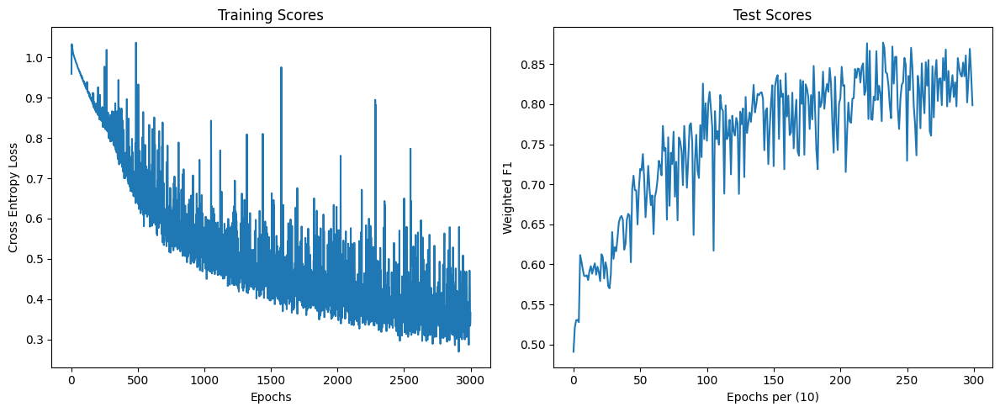

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
sigmoid function chosen for last layer.
Epoch 0, Training F1: 0.68549946, Test F1: 0.3377
Epoch 700, Training F1: 0.58116447, Test F1: 0.7246
Epoch 1400, Training F1: 0.41454137, Test F1: 0.8172
Epoch 2100, Training F1: 0.43243670, Test F1: 0.8105
Epoch 2800, Training F1: 0.34412587, Test F1: 0.8325
Training Duration: 34.65190672874451


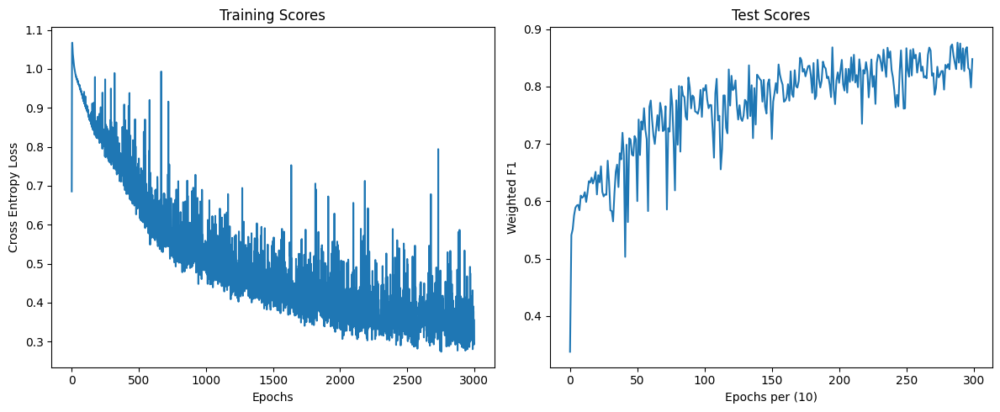

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
sigmoid function chosen for last layer.
Epoch 0, Training F1: 0.90139870, Test F1: 0.5300
Epoch 700, Training F1: 0.54760086, Test F1: 0.7634
Epoch 1400, Training F1: 0.49374343, Test F1: 0.7278
Epoch 2100, Training F1: 0.36932715, Test F1: 0.7996
Epoch 2800, Training F1: 0.43437359, Test F1: 0.7942
Training Duration: 30.821614503860474


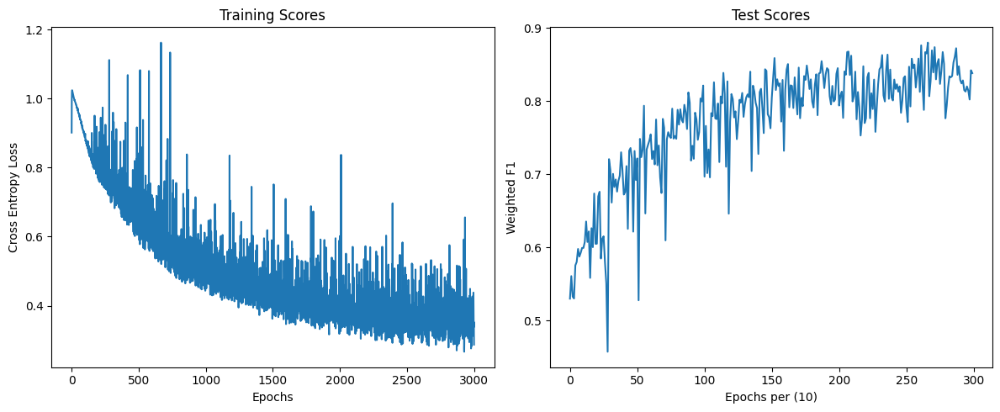

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
sigmoid function chosen for last layer.
Epoch 0, Training F1: 0.89467832, Test F1: 0.5239
Epoch 700, Training F1: 0.63450593, Test F1: 0.6884
Epoch 1400, Training F1: 0.51165513, Test F1: 0.7710
Epoch 2100, Training F1: 0.53215430, Test F1: 0.7720
Epoch 2800, Training F1: 0.40209647, Test F1: 0.8096
Training Duration: 30.24726629257202


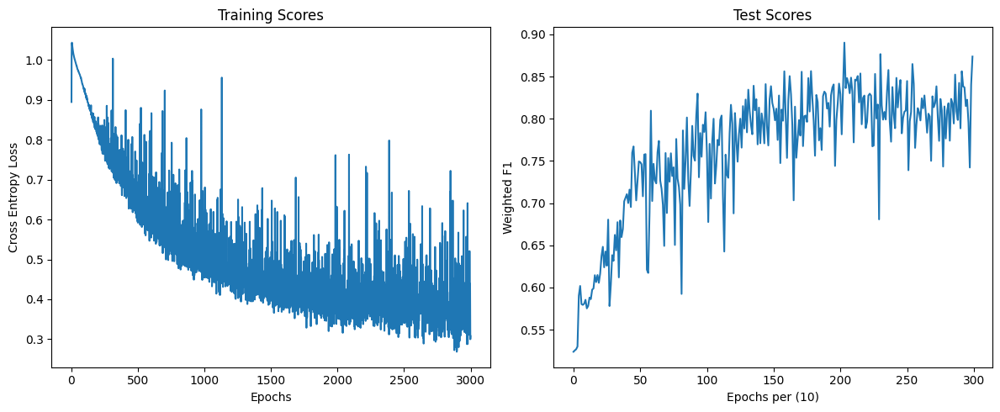

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
sigmoid function chosen for last layer.
Epoch 0, Training F1: 0.99848899, Test F1: 0.1352
Epoch 700, Training F1: 0.57045723, Test F1: 0.7645
Epoch 1400, Training F1: 0.45284943, Test F1: 0.8104
Epoch 2100, Training F1: 0.44124088, Test F1: 0.7952
Epoch 2800, Training F1: 0.31834826, Test F1: 0.8424
Training Duration: 31.094148874282837


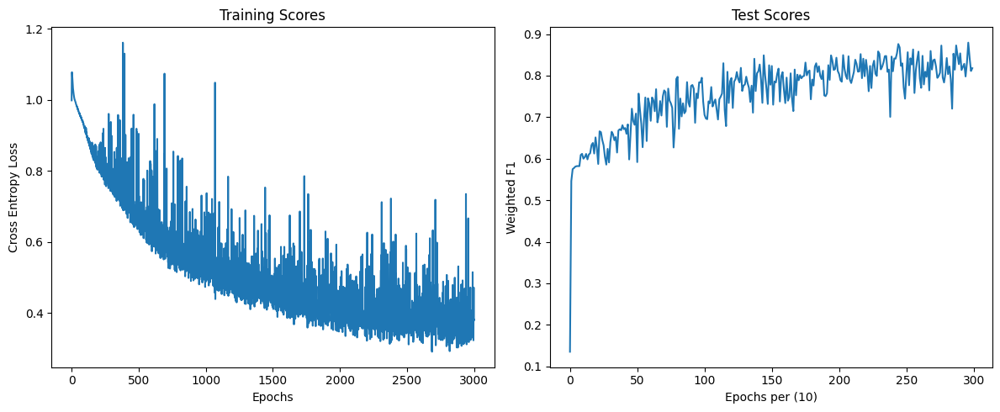

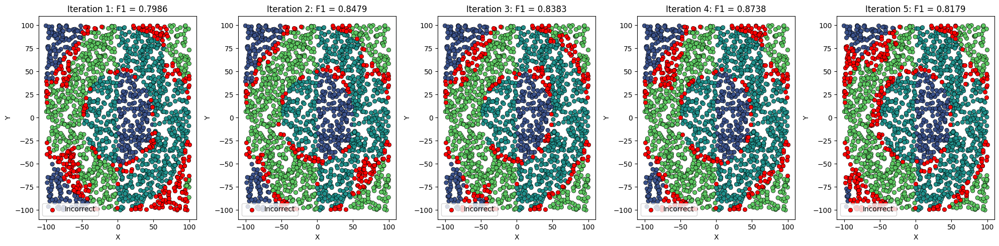

In [87]:
sigm2_test, sigm2_final, sigm2_time, sigm2_best = train_5_times_classif(layers=[2, 32,32, 3], activation="sigmoid", last_activation='sigmoid', learning_rate=0.01, init=None)

To slow learning - increase leraning rate an number of neurons

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
sigmoid function chosen for last layer.
Epoch 0, Training F1: 1.03794789, Test F1: 0.3827
Epoch 700, Training F1: 0.57899298, Test F1: 0.7187
Epoch 1400, Training F1: 0.43770515, Test F1: 0.8175
Epoch 2100, Training F1: 0.34819182, Test F1: 0.8004
Epoch 2800, Training F1: 0.44637595, Test F1: 0.7613
Training Duration: 53.63202953338623


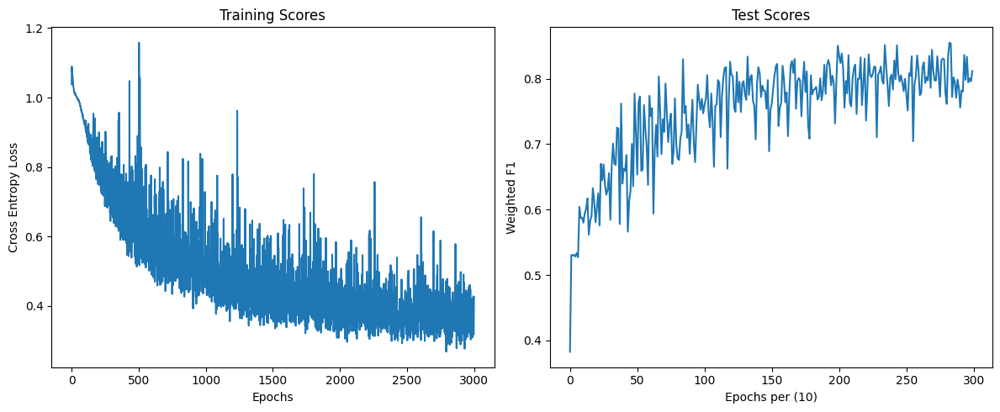

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
sigmoid function chosen for last layer.
Epoch 0, Training F1: 1.07128136, Test F1: 0.3793
Epoch 700, Training F1: 0.47833350, Test F1: 0.7782
Epoch 1400, Training F1: 0.35625007, Test F1: 0.8300
Epoch 2100, Training F1: 0.50131232, Test F1: 0.7394
Epoch 2800, Training F1: 0.42129349, Test F1: 0.7758
Training Duration: 56.44573998451233


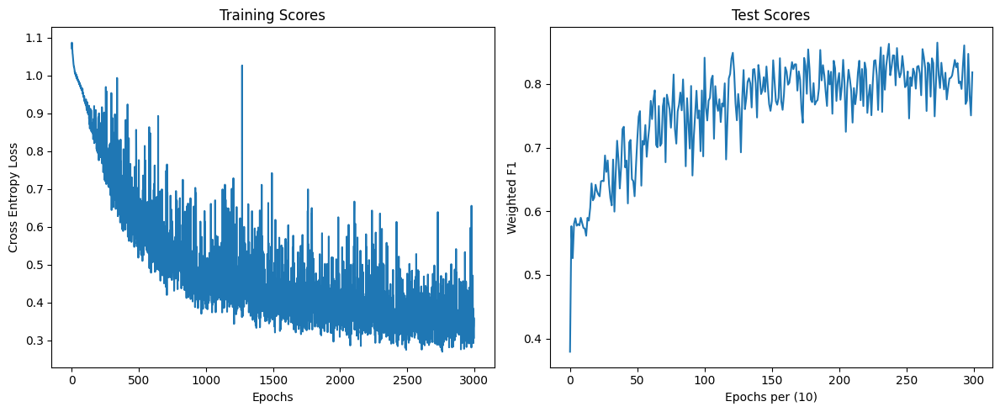

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
sigmoid function chosen for last layer.
Epoch 0, Training F1: 1.04031438, Test F1: 0.2790
Epoch 700, Training F1: 0.52815903, Test F1: 0.7939
Epoch 1400, Training F1: 0.45819669, Test F1: 0.7702
Epoch 2100, Training F1: 0.34892201, Test F1: 0.8041
Epoch 2800, Training F1: 0.30483869, Test F1: 0.8356
Training Duration: 58.84000301361084


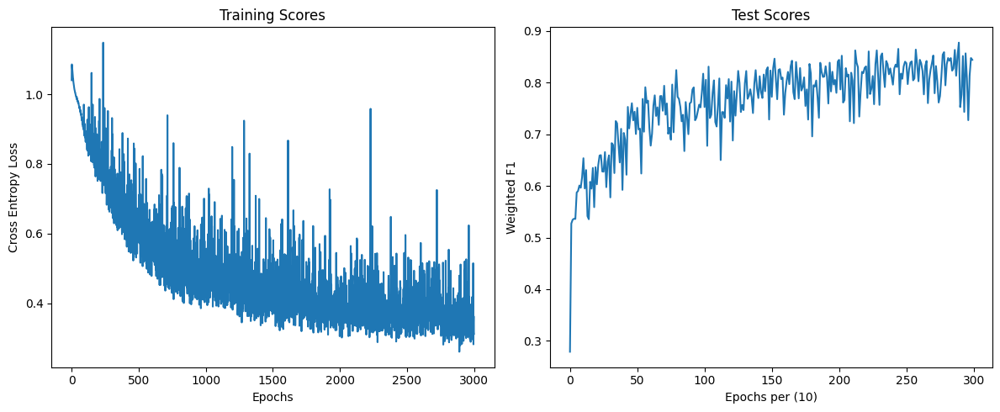

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
sigmoid function chosen for last layer.
Epoch 0, Training F1: 1.08925794, Test F1: 0.4548
Epoch 700, Training F1: 0.48650948, Test F1: 0.7146
Epoch 1400, Training F1: 0.42810486, Test F1: 0.8040
Epoch 2100, Training F1: 0.34447930, Test F1: 0.8416
Epoch 2800, Training F1: 0.31041484, Test F1: 0.8382
Training Duration: 56.72209644317627


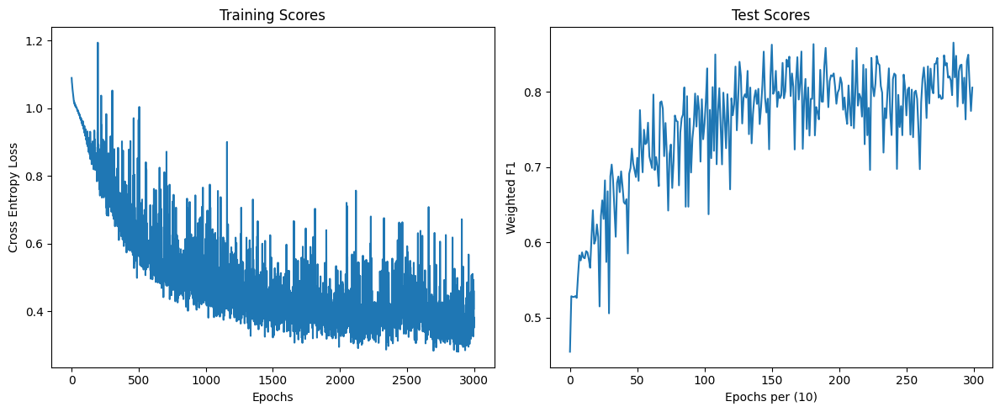

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
sigmoid function chosen for last layer.
Epoch 0, Training F1: 1.07689313, Test F1: 0.2869
Epoch 700, Training F1: 0.65422075, Test F1: 0.6738
Epoch 1400, Training F1: 0.37890258, Test F1: 0.8180
Epoch 2100, Training F1: 0.37195762, Test F1: 0.7963
Epoch 2800, Training F1: 0.38596042, Test F1: 0.8179
Training Duration: 57.48867702484131


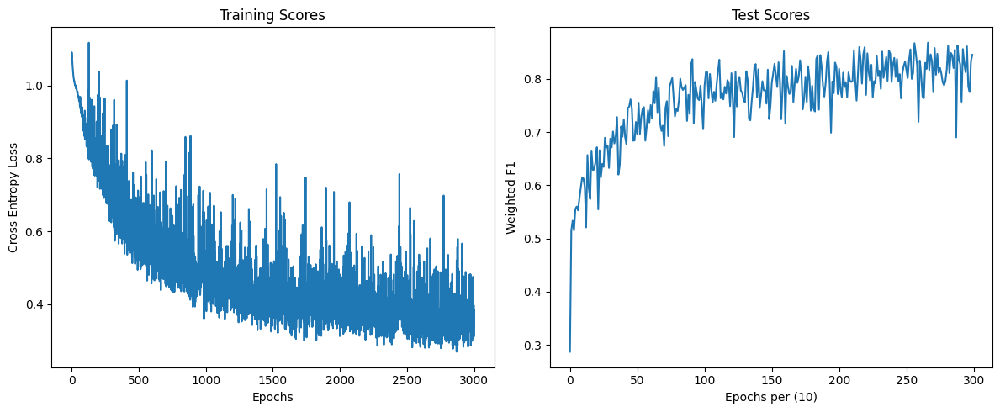

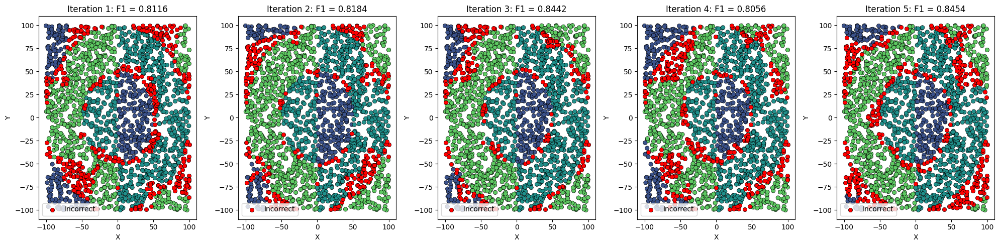

In [94]:
sigm2_test, sigm2_final, sigm2_time, sigm2_best = train_5_times_classif(layers=[2, 32,64,32, 3], activation="sigmoid", last_activation='sigmoid', learning_rate=0.02, init=None)

## Tanh

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
tanh function chosen for last layer.
Epoch 0, Training F1: 12.39676486, Test F1: 0.1467
Epoch 700, Training F1: 0.91416394, Test F1: 0.5970
Epoch 1400, Training F1: 0.83715101, Test F1: 0.6118
Epoch 2100, Training F1: 0.92218031, Test F1: 0.6248
Epoch 2800, Training F1: 0.79329070, Test F1: 0.6264
Training Duration: 20.7778263092041


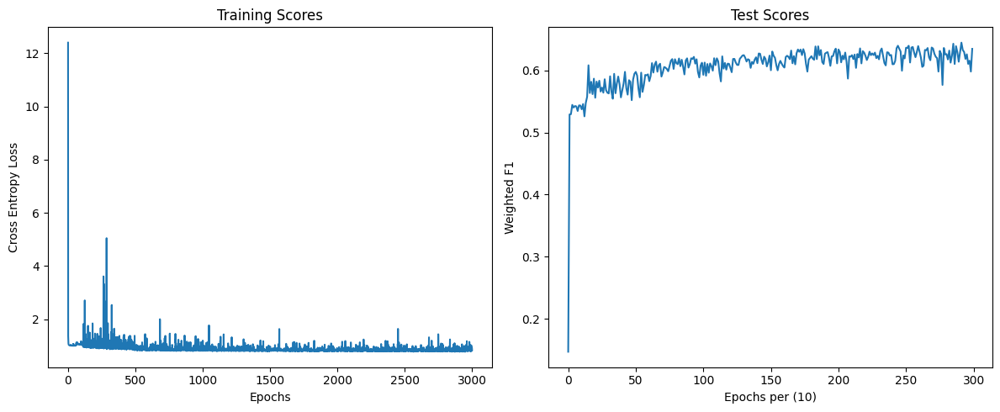

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
tanh function chosen for last layer.
Epoch 0, Training F1: 10.21109644, Test F1: 0.3170
Epoch 700, Training F1: 0.85991896, Test F1: 0.5924
Epoch 1400, Training F1: 0.69357006, Test F1: 0.6531
Epoch 2100, Training F1: 0.64287524, Test F1: 0.7006
Epoch 2800, Training F1: 1.68372940, Test F1: 0.5669
Training Duration: 22.009809255599976


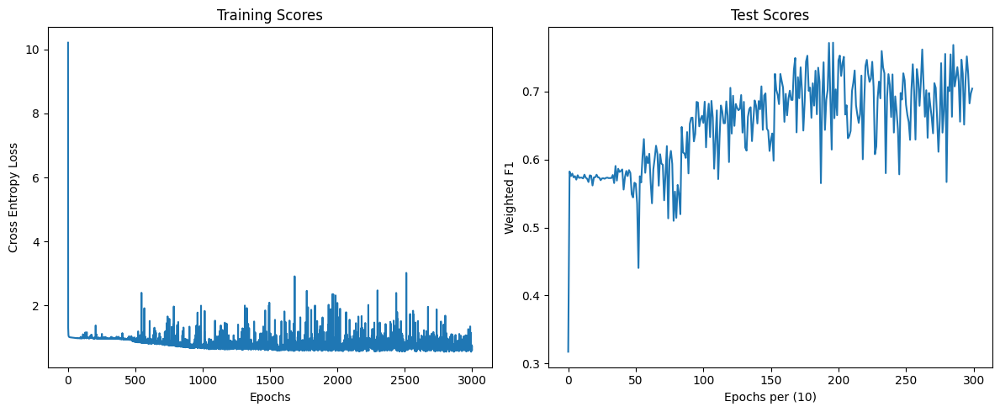

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
tanh function chosen for last layer.
Epoch 0, Training F1: 9.83277005, Test F1: 0.2425
Epoch 700, Training F1: 1.02710111, Test F1: 0.5100
Epoch 1400, Training F1: 0.72220112, Test F1: 0.6614
Epoch 2100, Training F1: 2.03996614, Test F1: 0.5316
Epoch 2800, Training F1: 0.65112862, Test F1: 0.7092
Training Duration: 22.065089225769043


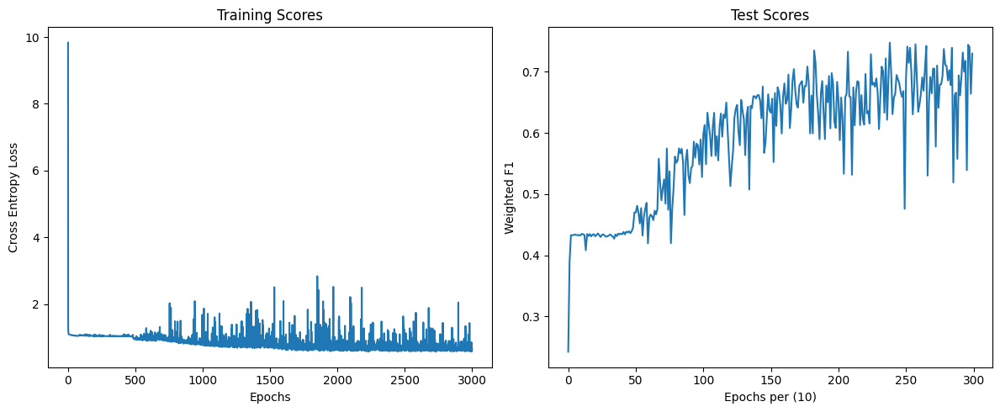

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
tanh function chosen for last layer.
Epoch 0, Training F1: 10.50093933, Test F1: 0.2165
Epoch 700, Training F1: 0.70792478, Test F1: 0.5796
Epoch 1400, Training F1: 0.64891559, Test F1: 0.6955
Epoch 2100, Training F1: 0.90537697, Test F1: 0.6448
Epoch 2800, Training F1: 0.62757975, Test F1: 0.7339
Training Duration: 22.01936674118042


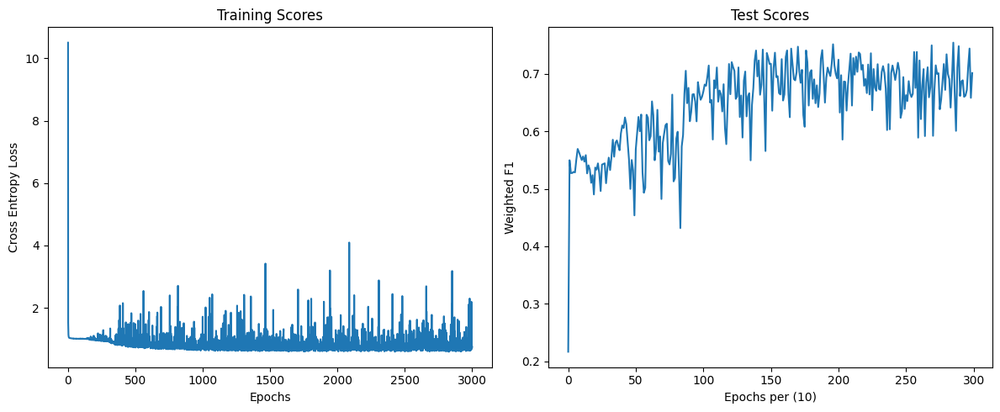

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
tanh function chosen for last layer.
Epoch 0, Training F1: 4.01673557, Test F1: 0.3189
Epoch 700, Training F1: 0.98839963, Test F1: 0.5701
Epoch 1400, Training F1: 0.71861284, Test F1: 0.6369
Epoch 2100, Training F1: 0.66745055, Test F1: 0.7298
Epoch 2800, Training F1: 0.72643380, Test F1: 0.6942
Training Duration: 21.755839824676514


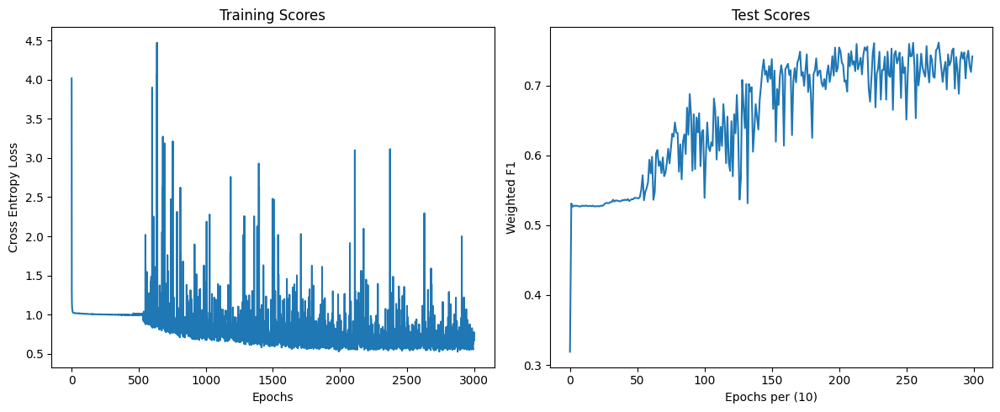

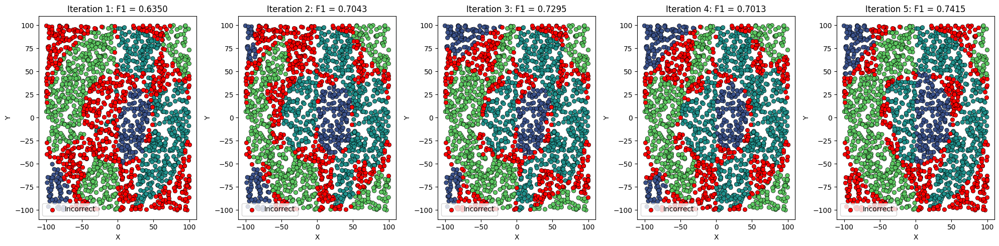

In [95]:
tanh1_test, tanh1_final, tanh1_time, tanh1_best = train_5_times_classif(layers=[2, 4,8,4, 3], activation="tanh", last_activation='tanh', learning_rate=0.01, init=None)

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
tanh function chosen for last layer.
Epoch 0, Training F1: 2.87651061, Test F1: 0.5505
Epoch 700, Training F1: 0.71079975, Test F1: 0.7071
Epoch 1400, Training F1: 0.55165935, Test F1: 0.7513
Epoch 2100, Training F1: 0.44153255, Test F1: 0.7892
Epoch 2800, Training F1: 0.42092461, Test F1: 0.7979
Training Duration: 106.87405252456665


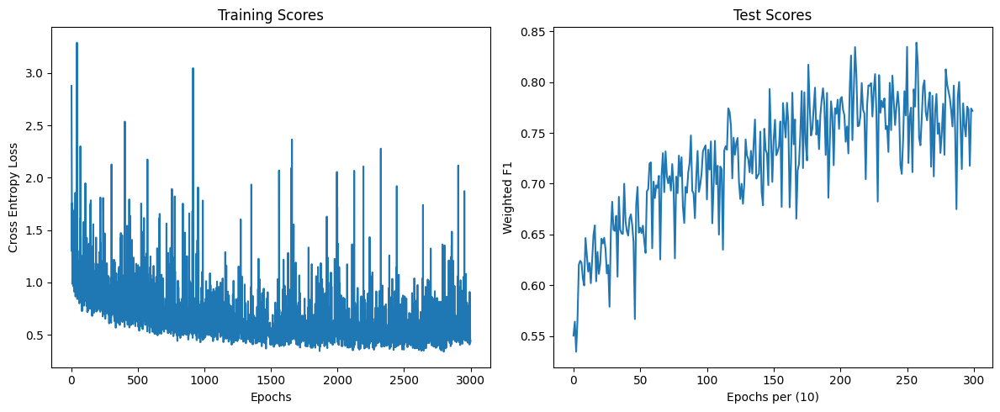

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
tanh function chosen for last layer.
Epoch 0, Training F1: 2.11831447, Test F1: 0.5379
Epoch 700, Training F1: 0.75814262, Test F1: 0.6788
Epoch 1400, Training F1: 0.86630001, Test F1: 0.7608
Epoch 2100, Training F1: 0.74990373, Test F1: 0.7846
Epoch 2800, Training F1: 0.57527708, Test F1: 0.7048
Training Duration: 116.28773975372314


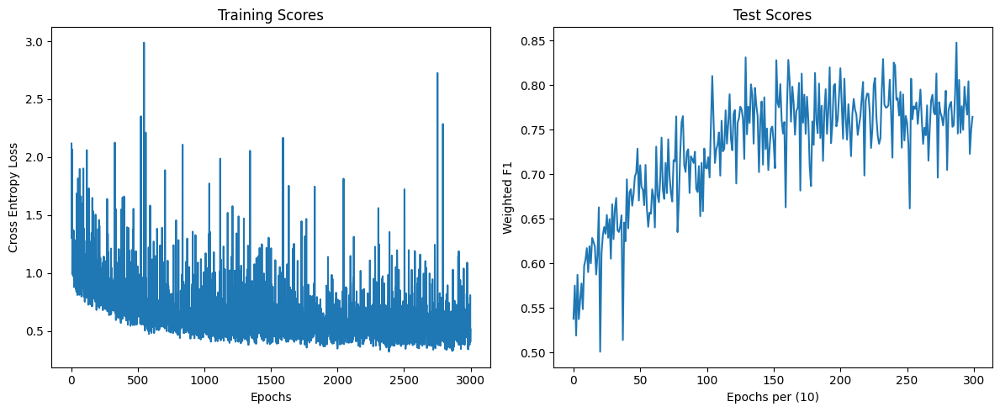

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
tanh function chosen for last layer.
Epoch 0, Training F1: 1.98538057, Test F1: 0.5421
Epoch 700, Training F1: 0.62392428, Test F1: 0.6900
Epoch 1400, Training F1: 0.53412006, Test F1: 0.7275
Epoch 2100, Training F1: 0.80617078, Test F1: 0.6528
Epoch 2800, Training F1: 0.47573730, Test F1: 0.7151
Training Duration: 116.89995121955872


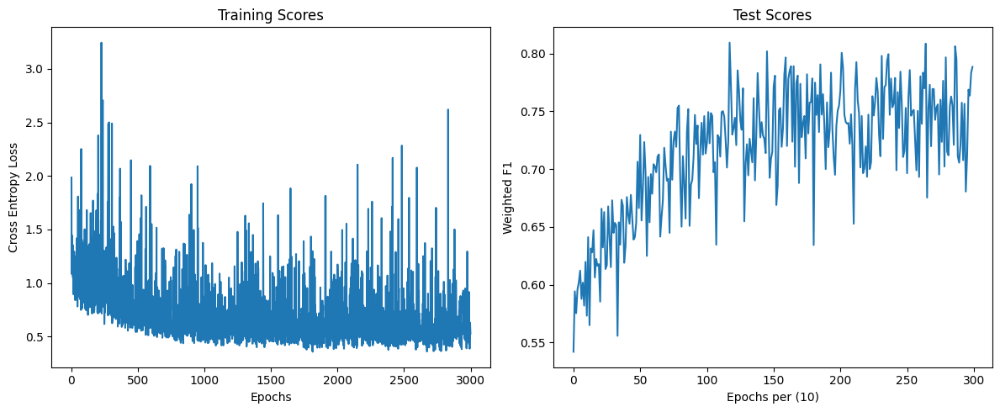

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
tanh function chosen for last layer.
Epoch 0, Training F1: 2.43662328, Test F1: 0.4726
Epoch 700, Training F1: 0.64635587, Test F1: 0.6875
Epoch 1400, Training F1: 0.57656937, Test F1: 0.7635
Epoch 2100, Training F1: 0.64099675, Test F1: 0.7737
Epoch 2800, Training F1: 0.50141557, Test F1: 0.7455
Training Duration: 124.84303092956543


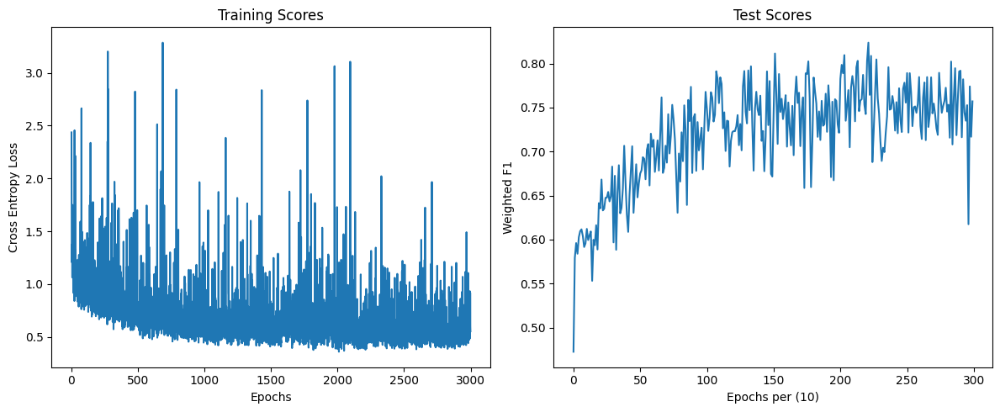

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
tanh function chosen for last layer.
Epoch 0, Training F1: 3.44681938, Test F1: 0.5102
Epoch 700, Training F1: 0.76516488, Test F1: 0.7044
Epoch 1400, Training F1: 0.53058138, Test F1: 0.7731
Epoch 2100, Training F1: 0.49431081, Test F1: 0.7408
Epoch 2800, Training F1: 0.46075213, Test F1: 0.7681
Training Duration: 127.10034775733948


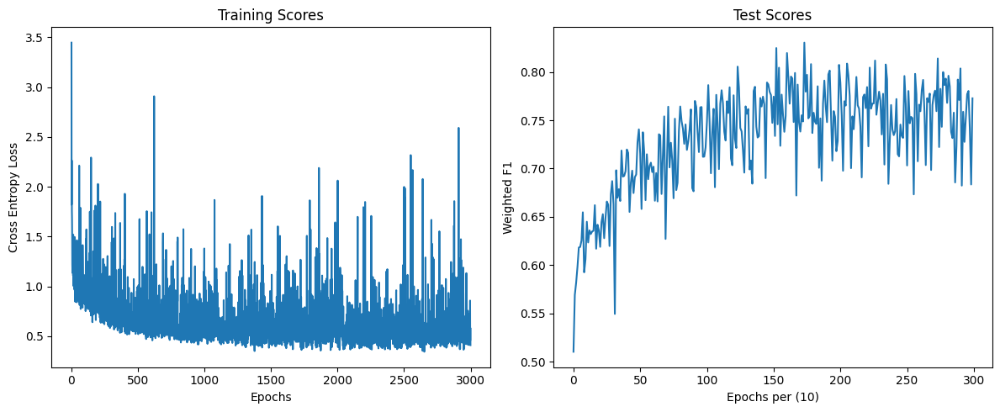

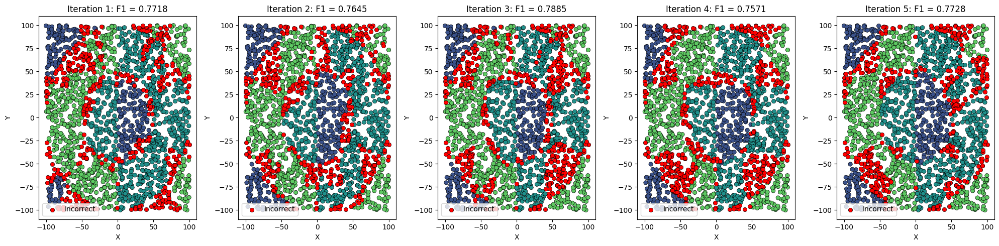

In [96]:
tanh2_test, tanh2_final, tanh2_time, tanh2_best = train_5_times_classif(layers=[2, 32,64,32, 3], activation="tanh", last_activation='tanh', learning_rate=0.03, init=None)

## Results


In [97]:
df = pd.DataFrame({
    'Activation' :['Softmax','Softmax', 'Sigmoid', 'Sigmoid', 'Tanh', 'Tanh'],
    'Layers': ['4 8 4', '32 64 32', '4 8 4', '32 64 32','4 8 4', '32 64 32'],
    'Mean Time': [softmax_time, soft2_time, sigm_time, sigm2_time, tanh1_time, tanh2_time],
    'Mean MSE': [softmax_final, soft2_final, sigm_final, sigm2_final, tanh1_final, tanh2_final],
    'Best achieved MSE' : [softmax_best, soft2_best, sigm_best, sigm2_best, tanh1_best, tanh2_best]
})
df

,Activation,Layers,Mean Time,Mean MSE,Best achieved MSE
0,Softmax,4 8 4,14.438452,0.897777,0.929973
1,Softmax,32 64 32,32.859576,0.917490,0.931965
2,Sigmoid,4 8 4,19.522496,0.672092,0.771487
3,Sigmoid,32 64 32,56.625709,0.825039,0.845350
4,Tanh,4 8 4,21.725586,0.702313,0.741497
5,Tanh,32 64 32,118.401024,0.770925,0.788472


**Conclusions**
* Softmax achieved best results for both architectures
* Sigmoid performed better on more complex architecture
* Mean F1 and best F1 are close 
* Tanh appeared to be the worst activation for this data and architectures

# Part 4 - Rings5

In [4]:
train_df = pd.read_csv('data/rings5-regular-training.csv')
test_df = pd.read_csv('data/rings5-regular-test.csv')

X_train = train_df[['x', 'y']].to_numpy()
Y_train = train_df['c'].to_numpy().reshape(-1,1)  
X_test = test_df[['x', 'y']].to_numpy()
Y_test = test_df['c'].to_numpy().reshape(-1,1)  

# # Kodowanie one-hot dla Y
y_encoder = OneHotEncoder(sparse_output=False)
Y_train_encoded = y_encoder.fit_transform(Y_train)  
Y_test_encoded = y_encoder.transform(Y_test) 

print(f'Number of classes: {train_df["c"].nunique()}')

Number of classes: 5


## Tests

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 1.77332034, Test F1: 0.2195
Epoch 100, Training F1: 0.67126462, Test F1: 0.6041
Epoch 200, Training F1: 0.43178417, Test F1: 0.8210
Epoch 300, Training F1: 0.56686351, Test F1: 0.6668
Epoch 400, Training F1: 0.59876658, Test F1: 0.7216
Epoch 500, Training F1: 1.31754984, Test F1: 0.6424
Epoch 600, Training F1: 0.65900189, Test F1: 0.6895
Epoch 700, Training F1: 0.37326455, Test F1: 0.7721
Epoch 800, Training F1: 0.45710254, Test F1: 0.7994
Epoch 900, Training F1: 0.40346621, Test F1: 0.7617
Epoch 1000, Training F1: 0.45228335, Test F1: 0.7801
Epoch 1100, Training F1: 0.36996263, Test F1: 0.7854
Epoch 1200, Training F1: 1.86202194, Test F1: 0.5149
Epoch 1300, Training F1: 0.35536024, Test F1: 0.7788
Epoch 1400, Training F1: 1.64258528, Test F1: 0.6018
Epoch 1500, Training F1: 0.51334997, Test F1: 0.7390
Epoc

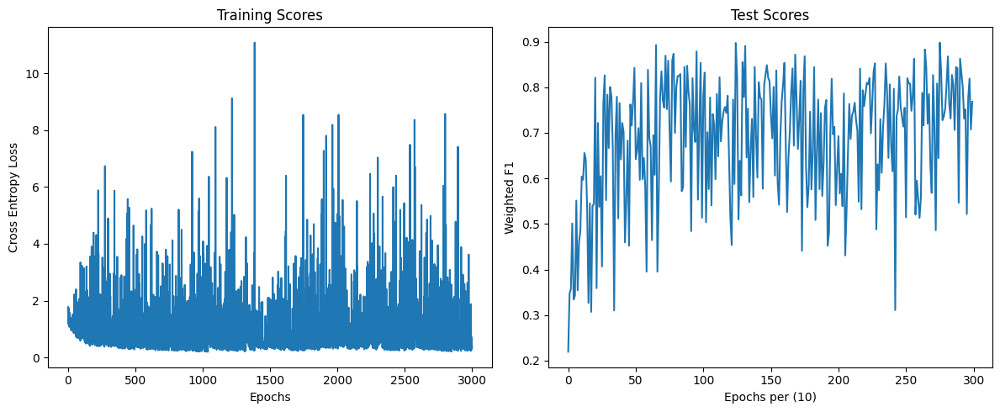

In [14]:
nn = NeuralNetwork(layers=[2, 8,10,8, 5], activation="relu", last_layer_activation='softmax')
soft1_train, soft1_test,soft1_final, soft1_time, soft1_epoch = nn.train(X_train, Y_train_encoded, X_test, Y_test_encoded,loss_func='F1',  learning_rate=0.01, epochs=3000, report_frequency=10, loss_threshold=1.9)

Final score Ok, lets try other combinations

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 1.48680650, Test F1: 0.1626
Epoch 100, Training F1: 1.13123904, Test F1: 0.3368
Epoch 200, Training F1: 1.11282276, Test F1: 0.2897
Epoch 300, Training F1: 1.08737153, Test F1: 0.3932
Epoch 400, Training F1: 1.02332376, Test F1: 0.4225
Epoch 500, Training F1: 1.06310745, Test F1: 0.3190
Epoch 600, Training F1: 1.10787279, Test F1: 0.3513
Epoch 700, Training F1: 0.95175671, Test F1: 0.4229
Epoch 800, Training F1: 0.94954613, Test F1: 0.3847
Epoch 900, Training F1: 1.05987947, Test F1: 0.3891
Epoch 1000, Training F1: 0.85604489, Test F1: 0.4073
Epoch 1100, Training F1: 0.88459978, Test F1: 0.4082
Epoch 1200, Training F1: 0.85812374, Test F1: 0.3972
Epoch 1300, Training F1: 1.24808789, Test F1: 0.3392
Epoch 1400, Training F1: 0.75983761, Test F1: 0.4765
Epoch 1500, Training F1: 1.08426117, Test F1: 0.3310
Epoc

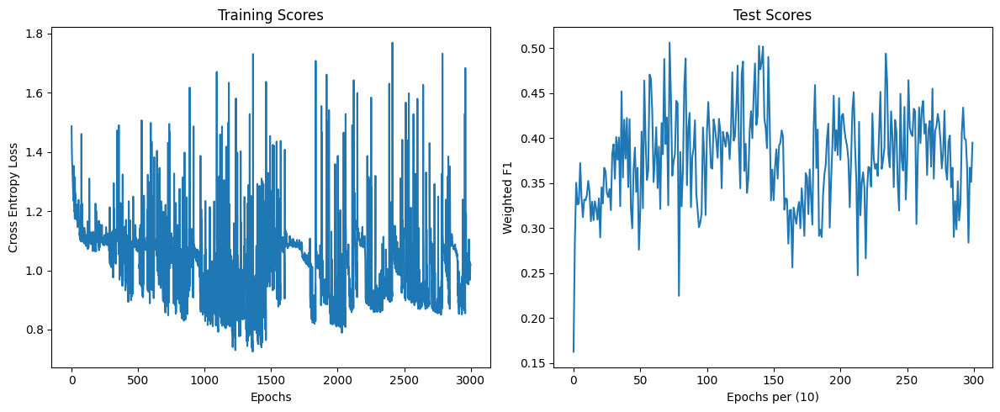

In [20]:
nn = NeuralNetwork(layers=[2, 10,18,10, 5], activation="tanh", last_layer_activation='softmax')
soft1_train, soft1_test,soft1_final, soft1_time, soft1_epoch = nn.train(X_train, Y_train_encoded, X_test, Y_test_encoded,loss_func='F1',  learning_rate=0.02, epochs=3000, report_frequency=10, loss_threshold=1.9)

despite of more neurons tanh + softmax get poor results

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
sigmoid function chosen for last layer.
Epoch 0, Training F1: 0.68122951, Test F1: 0.0055
Epoch 100, Training F1: 1.60516278, Test F1: 0.0423
Epoch 200, Training F1: 1.58739414, Test F1: 0.2106
Epoch 300, Training F1: 1.46522485, Test F1: 0.1815
Epoch 400, Training F1: 1.36796176, Test F1: 0.3726
Epoch 500, Training F1: 1.36676239, Test F1: 0.3785
Epoch 600, Training F1: 1.33503198, Test F1: 0.3350
Epoch 700, Training F1: 1.31727002, Test F1: 0.3952
Epoch 800, Training F1: 1.29259217, Test F1: 0.3868
Epoch 900, Training F1: 1.25588528, Test F1: 0.4076
Epoch 1000, Training F1: 1.23334191, Test F1: 0.4004
Epoch 1100, Training F1: 1.26100807, Test F1: 0.2958
Epoch 1200, Training F1: 1.23448881, Test F1: 0.3864
Epoch 1300, Training F1: 1.17898705, Test F1: 0.4104
Epoch 1400, Training F1: 1.12988776, Test F1: 0.4878
Epoch 1500, Training F1: 1.12429841, Test F1: 0.4217
Epoc

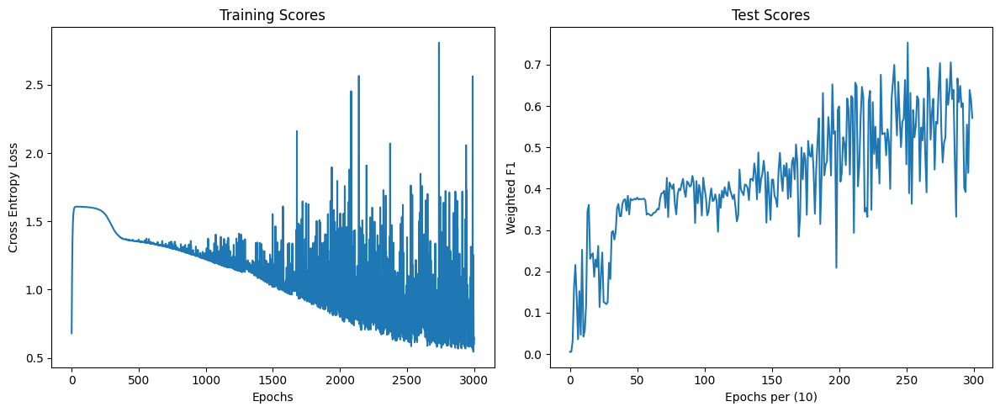

In [21]:
nn = NeuralNetwork(layers=[2, 8,10,8, 5], activation="sigmoid", last_layer_activation='sigmoid')
sigm1_train, sigm1_test,sigm1_final, sigm1_time, sigm1_epoch = nn.train(X_train, Y_train_encoded, X_test, Y_test_encoded,loss_func='F1',  learning_rate=0.01, epochs=3000, report_frequency=10, loss_threshold=1.9)

Not the best, lets change parameters and try to make it better

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
sigmoid function chosen for last layer.
Epoch 0, Training F1: 1.07515334, Test F1: 0.3344
Epoch 100, Training F1: 1.57836287, Test F1: 0.4561
Epoch 200, Training F1: 1.43423350, Test F1: 0.4523
Epoch 300, Training F1: 0.90065965, Test F1: 0.6394
Epoch 400, Training F1: 0.90516263, Test F1: 0.7141
Epoch 500, Training F1: 0.59232782, Test F1: 0.6918
Epoch 600, Training F1: 0.34757131, Test F1: 0.8063
Epoch 700, Training F1: 2.58737919, Test F1: 0.4186
Epoch 800, Training F1: 0.97026154, Test F1: 0.6658
Epoch 900, Training F1: 0.85572689, Test F1: 0.5566
Epoch 1000, Training F1: 0.45806119, Test F1: 0.7466
Epoch 1100, Training F1: 0.97793721, Test F1: 0.6619
Epoch 1200, Training F1: 0.30734707, Test F1: 0.8217
Epoch 1300, Training F1: 1.12568122, Test F1: 0.6155
Epoch 1400, Training F1: 0.84898128, Test F1: 0.6935
Epoch 1500, Training F1: 0.47125746, Test F1: 0.7597
Epoc

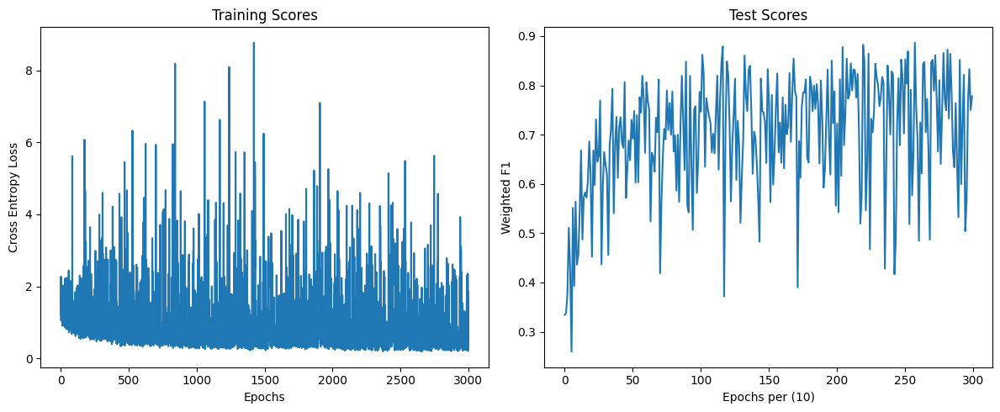

In [28]:
nn = NeuralNetwork(layers=[2, 18,30,18, 5], activation="relu", last_layer_activation='sigmoid')
s1_train, s1_test,s1_final, s1_time, s1_epoch = nn.train(X_train, Y_train_encoded, X_test, Y_test_encoded,loss_func='F1',  learning_rate=0.01, epochs=3000, report_frequency=10, loss_threshold=1.9)

Now better with relu in hidden layers

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
tanh function chosen for last layer.
Epoch 0, Training F1: 6.68009745, Test F1: 0.2447
Epoch 100, Training F1: 2.16008638, Test F1: 0.2821
Epoch 200, Training F1: 2.26668662, Test F1: 0.3236
Epoch 300, Training F1: 1.68955170, Test F1: 0.2826
Epoch 400, Training F1: 2.51644853, Test F1: 0.3846
Epoch 500, Training F1: 1.01179530, Test F1: 0.3179
Epoch 600, Training F1: 1.07332167, Test F1: 0.3428
Epoch 700, Training F1: 1.03421596, Test F1: 0.4506
Epoch 800, Training F1: 1.59217359, Test F1: 0.3549
Epoch 900, Training F1: 5.53580823, Test F1: 0.3727
Epoch 1000, Training F1: 1.07059094, Test F1: 0.2963
Epoch 1100, Training F1: 2.17694550, Test F1: 0.4128
Epoch 1200, Training F1: 1.70064756, Test F1: 0.3161
Epoch 1300, Training F1: 1.62559766, Test F1: 0.3389
Epoch 1400, Training F1: 1.37626197, Test F1: 0.4002
Epoch 1500, Training F1: 1.06622301, Test F1: 0.4706
Epoch 1

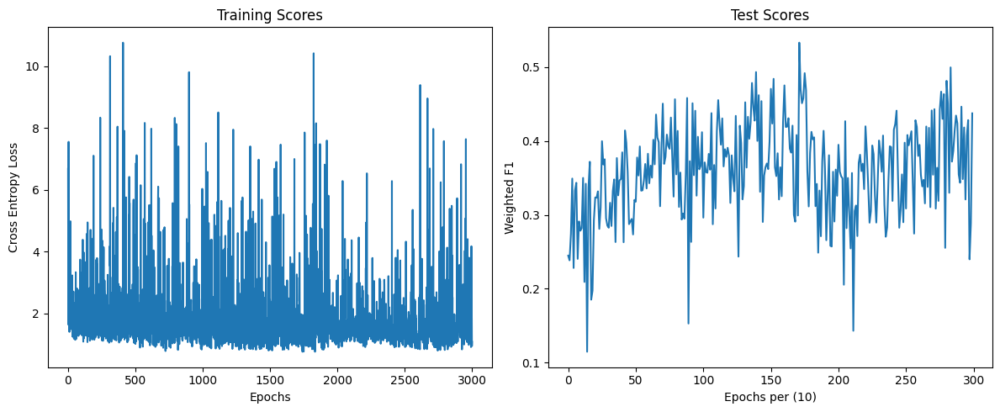

In [31]:
nn = NeuralNetwork(layers=[2, 18,18,18, 5], activation="tanh", last_layer_activation='tanh')
soft1_train, soft1_test,soft1_final, soft1_time, soft1_epoch = nn.train(X_train, Y_train_encoded, X_test, Y_test_encoded,loss_func='F1',  learning_rate=0.1, epochs=3000, report_frequency=10, loss_threshold=1.9)

Poor results on tanh with big architeture

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
tanh function chosen for last layer.
Epoch 0, Training F1: 2.50039872, Test F1: 0.3623
Epoch 100, Training F1: 1.17231724, Test F1: 0.3098
Epoch 200, Training F1: 1.07444979, Test F1: 0.3242
Epoch 300, Training F1: 1.16204595, Test F1: 0.3161
Epoch 400, Training F1: 2.64929540, Test F1: 0.3133
Epoch 500, Training F1: 1.13752571, Test F1: 0.3367
Epoch 600, Training F1: 0.94910096, Test F1: 0.3243
Epoch 700, Training F1: 2.78345320, Test F1: 0.2662
Epoch 800, Training F1: 0.96371115, Test F1: 0.3816
Epoch 900, Training F1: 1.49756711, Test F1: 0.3567
Epoch 1000, Training F1: 0.92991157, Test F1: 0.3589
Epoch 1100, Training F1: 1.77827782, Test F1: 0.4896
Epoch 1200, Training F1: 0.81415318, Test F1: 0.4280
Epoch 1300, Training F1: 0.81485262, Test F1: 0.3751
Epoch 1400, Training F1: 0.76724101, Test F1: 0.4962
Epoch 1500, Training F1: 0.97322001, Test F1: 0.4254
Epoch 1

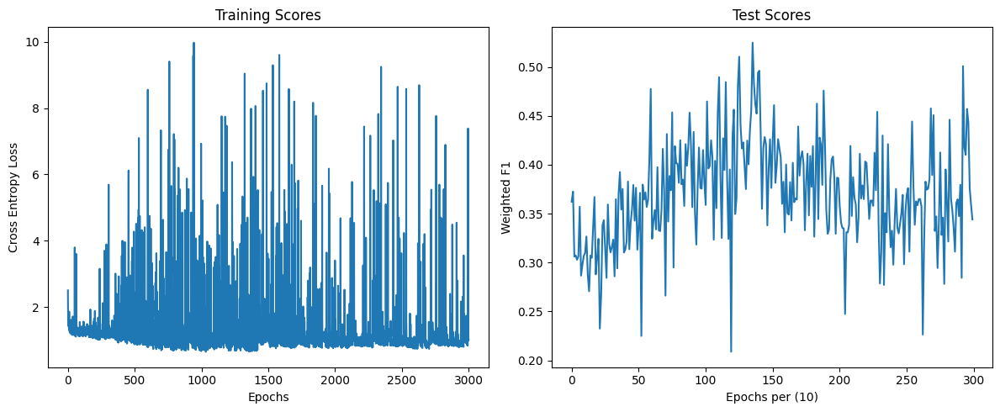

In [32]:
nn = NeuralNetwork(layers=[2, 10,10, 5], activation="tanh", last_layer_activation='tanh')
soft1_train, soft1_test,soft1_final, soft1_time, soft1_epoch = nn.train(X_train, Y_train_encoded, X_test, Y_test_encoded,loss_func='F1',  learning_rate=0.03, epochs=3000, report_frequency=10, loss_threshold=1.9)

Small architecture not better

## Results

Relu + Softmax

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 1.42997555, Test F1: 0.3101
Epoch 700, Training F1: 1.35450680, Test F1: 0.1725
Epoch 1400, Training F1: 3.49736150, Test F1: 0.1619
Epoch 2100, Training F1: 0.96682568, Test F1: 0.5150
Epoch 2800, Training F1: 2.01362691, Test F1: 0.5322
Training Duration: 18.89464569091797


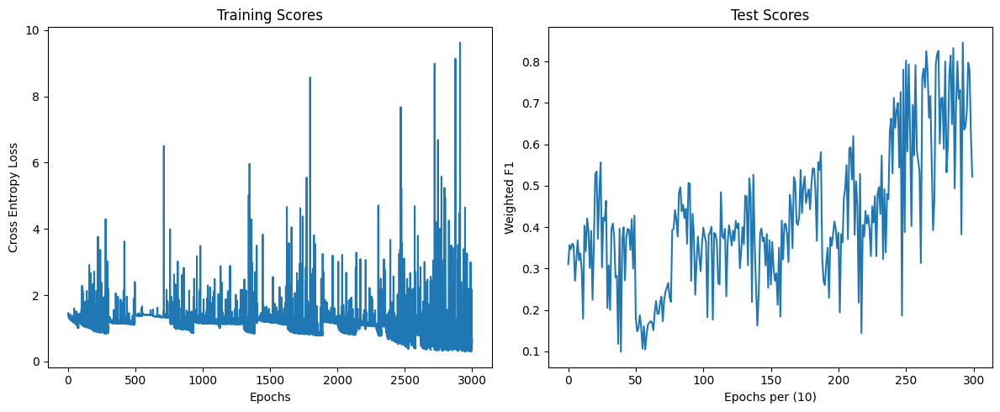

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 1.59157086, Test F1: 0.1878
Epoch 700, Training F1: 0.43611979, Test F1: 0.7835
Epoch 1400, Training F1: 0.35777979, Test F1: 0.8033
Epoch 2100, Training F1: 0.40601640, Test F1: 0.7917
Epoch 2800, Training F1: 0.61647094, Test F1: 0.6786
Training Duration: 28.067033529281616


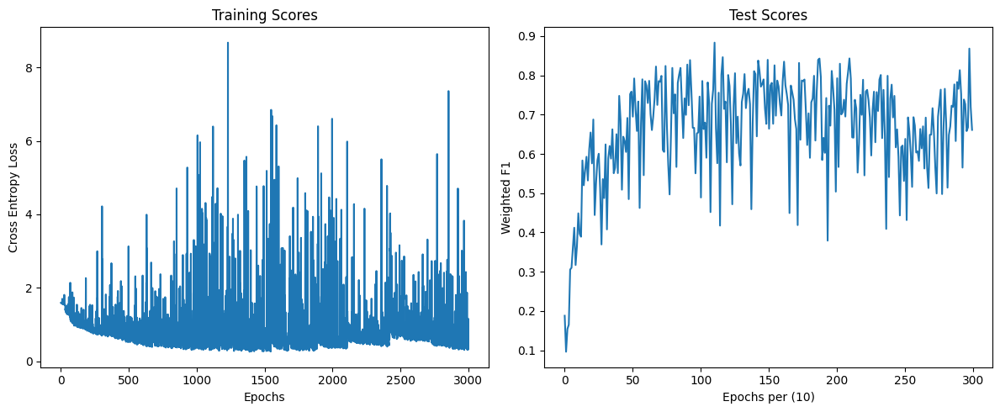

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 1.45986003, Test F1: 0.1866
Epoch 700, Training F1: 0.41064354, Test F1: 0.7714
Epoch 1400, Training F1: 0.34085370, Test F1: 0.7967
Epoch 2100, Training F1: 2.35925539, Test F1: 0.6247
Epoch 2800, Training F1: 0.74995521, Test F1: 0.5838
Training Duration: 21.278558015823364


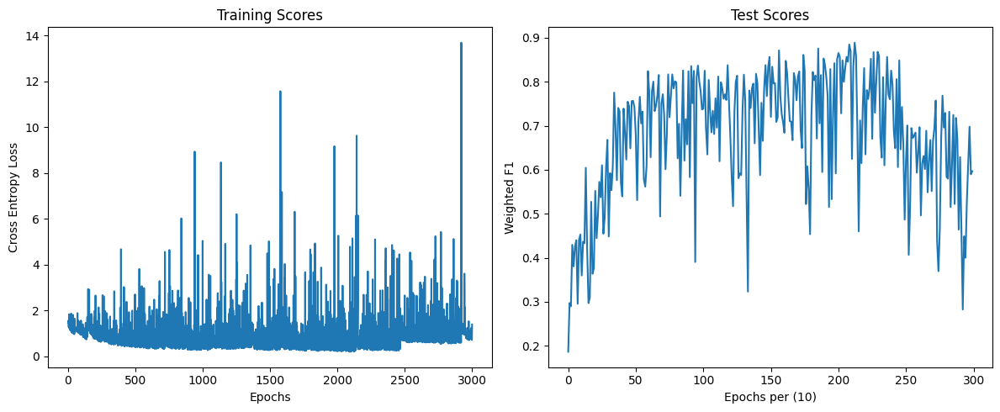

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 1.58060900, Test F1: 0.0749
Epoch 700, Training F1: 1.40680834, Test F1: 0.1159
Epoch 1400, Training F1: 1.40675942, Test F1: 0.1159
Epoch 2100, Training F1: 1.40674024, Test F1: 0.1159
Epoch 2800, Training F1: 1.40677772, Test F1: 0.1159
Training Duration: 22.079142570495605


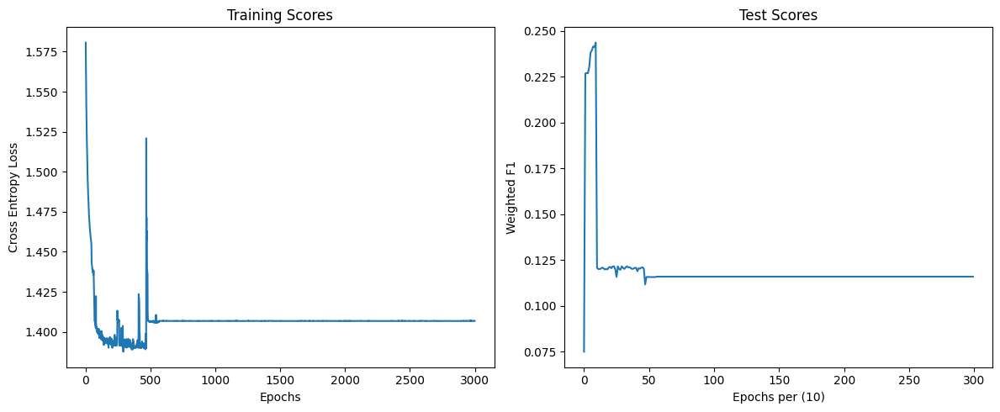

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 1.80032458, Test F1: 0.1518
Epoch 700, Training F1: 1.55407098, Test F1: 0.3036
Epoch 1400, Training F1: 0.67545928, Test F1: 0.6925
Epoch 2100, Training F1: 1.29952636, Test F1: 0.6863
Epoch 2800, Training F1: 0.78323609, Test F1: 0.6939
Training Duration: 22.80276608467102


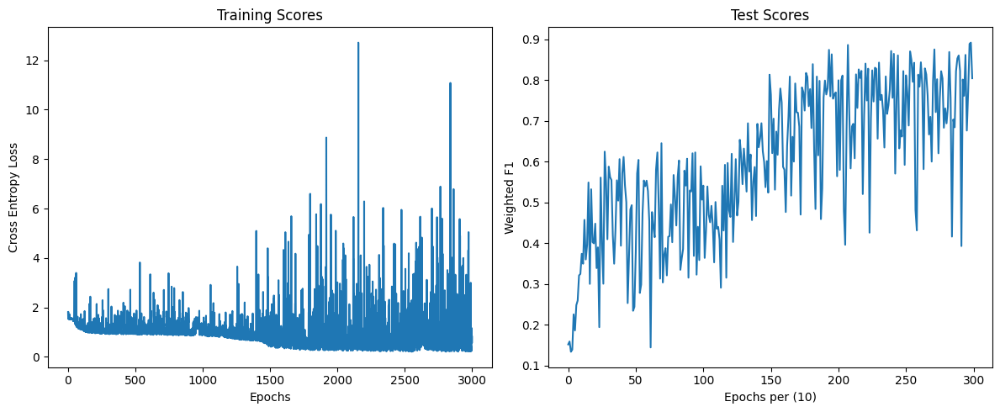

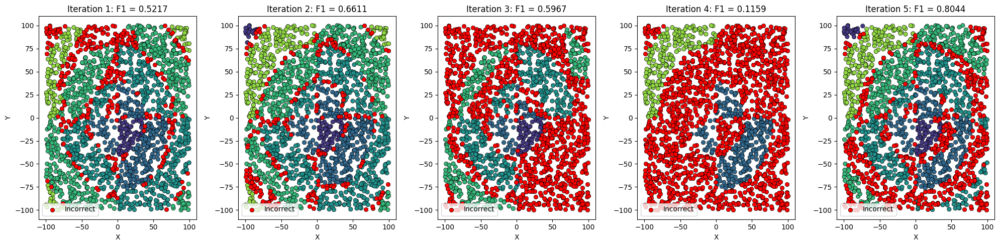

In [36]:
soft1_test,soft1_final, soft1_time, soft1_best =train_5_times_classif(layers=[2, 8,10,8, 5], activation="relu", last_activation='softmax' , learning_rate=0.01, init='He')

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 1.56500386, Test F1: 0.1045
Epoch 700, Training F1: 0.84912735, Test F1: 0.5461
Epoch 1400, Training F1: 0.62567351, Test F1: 0.6624
Epoch 2100, Training F1: 0.47837684, Test F1: 0.7400
Epoch 2800, Training F1: 0.35210352, Test F1: 0.7855
Training Duration: 20.688143491744995


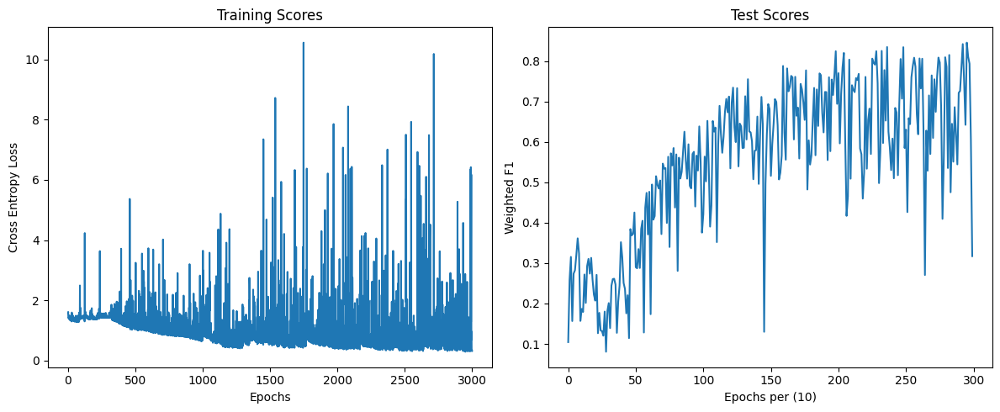

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 1.64251033, Test F1: 0.0414
Epoch 700, Training F1: 1.60945814, Test F1: 0.1779
Epoch 1400, Training F1: 1.60949570, Test F1: 0.1779
Epoch 2100, Training F1: 1.60945447, Test F1: 0.0414
Epoch 2800, Training F1: 1.60945432, Test F1: 0.1779
Training Duration: 22.09511947631836


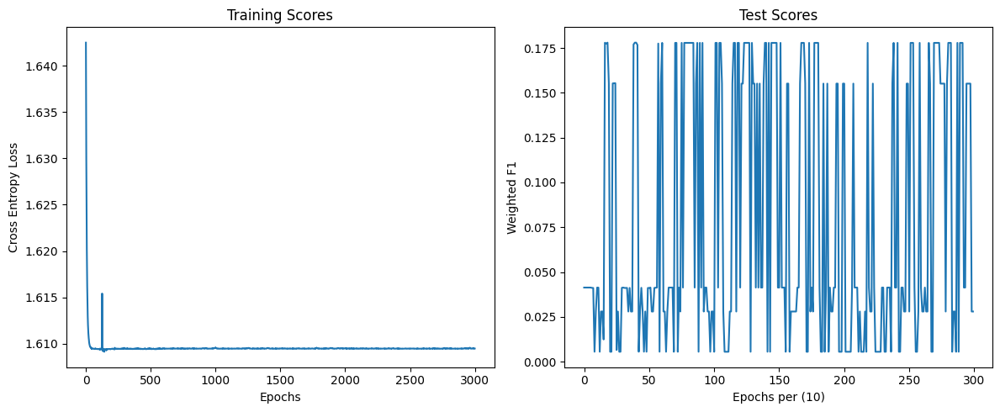

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 1.59748478, Test F1: 0.2052
Epoch 700, Training F1: 0.65408027, Test F1: 0.6382
Epoch 1400, Training F1: 0.39842459, Test F1: 0.7155
Epoch 2100, Training F1: 0.43905298, Test F1: 0.7420
Epoch 2800, Training F1: 0.26607807, Test F1: 0.8626
Training Duration: 21.658292531967163


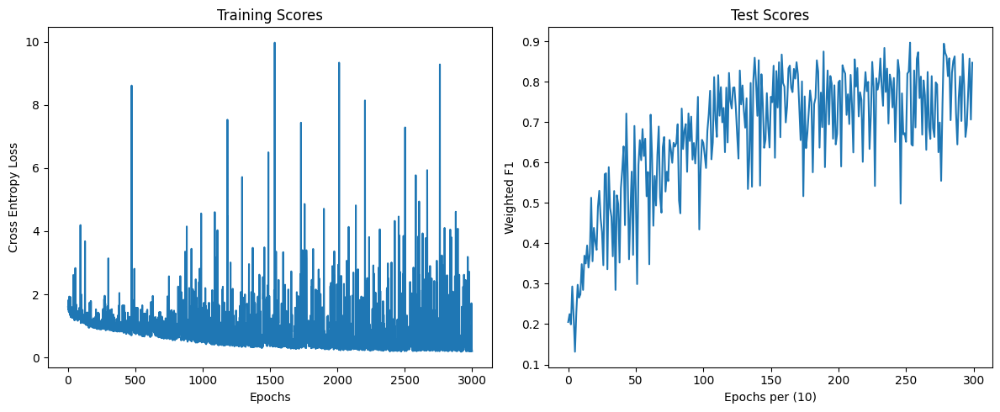

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 1.38505641, Test F1: 0.3247
Epoch 700, Training F1: 1.55352356, Test F1: 0.5471
Epoch 1400, Training F1: 2.81654263, Test F1: 0.6326
Epoch 2100, Training F1: 1.49147520, Test F1: 0.5849
Epoch 2800, Training F1: 0.72022171, Test F1: 0.7991
Training Duration: 21.869056940078735


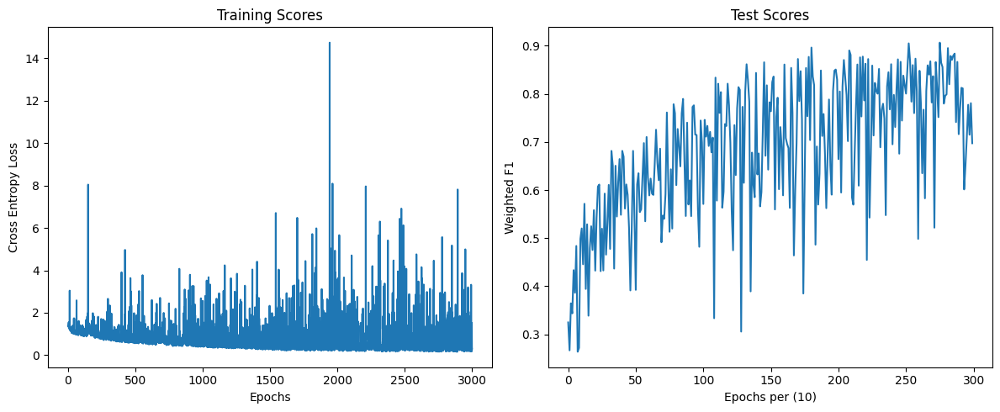

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
softmax function chosen for last layer.
Epoch 0, Training F1: 1.69952102, Test F1: 0.0988
Epoch 700, Training F1: 0.36907985, Test F1: 0.7637
Epoch 1400, Training F1: 1.13477029, Test F1: 0.6368
Epoch 2100, Training F1: 1.23340612, Test F1: 0.6346
Epoch 2800, Training F1: 0.28132335, Test F1: 0.8655
Training Duration: 22.847532510757446


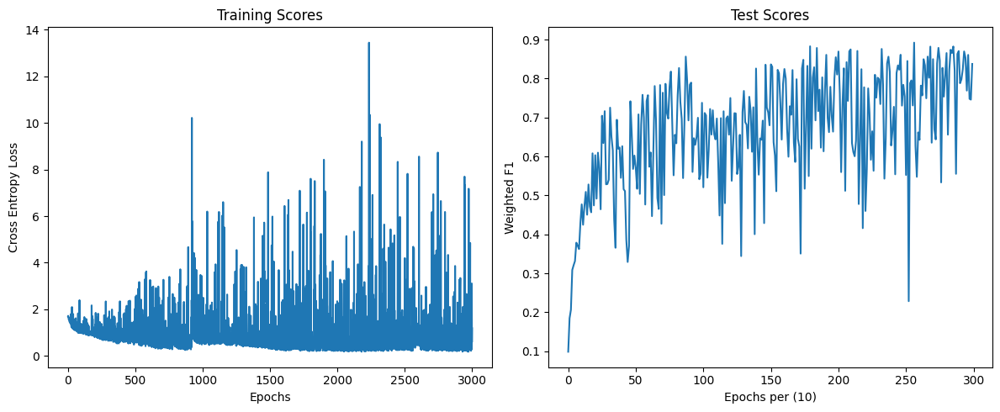

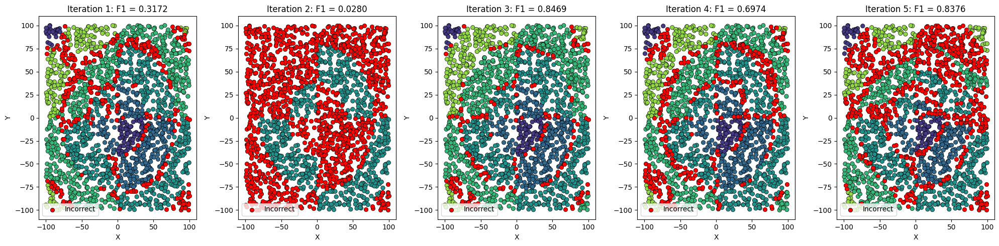

In [39]:
soft1_test,soft1_final, soft1_time, soft1_best =train_5_times_classif(layers=[2, 18,20,18, 5], activation="relu", last_activation='softmax' , learning_rate=0.01, init='He')

Relu + sigmoid

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
sigmoid function chosen for last layer.
Epoch 0, Training F1: 1.21299728, Test F1: 0.4258
Epoch 700, Training F1: 0.72809274, Test F1: 0.6867
Epoch 1400, Training F1: 2.45210894, Test F1: 0.4221
Epoch 2100, Training F1: 4.42238809, Test F1: 0.5157
Epoch 2800, Training F1: 1.17013703, Test F1: 0.7308
Training Duration: 20.556141138076782


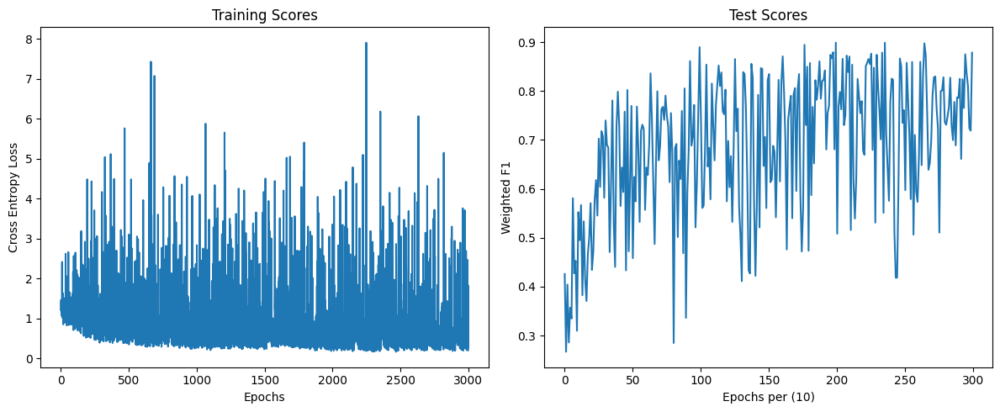

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
sigmoid function chosen for last layer.
Epoch 0, Training F1: 1.01098982, Test F1: 0.3670
Epoch 700, Training F1: 1.25015059, Test F1: 0.6860
Epoch 1400, Training F1: 1.33791320, Test F1: 0.6551
Epoch 2100, Training F1: 0.58422154, Test F1: 0.6842
Epoch 2800, Training F1: 2.29818625, Test F1: 0.6057
Training Duration: 22.33647584915161


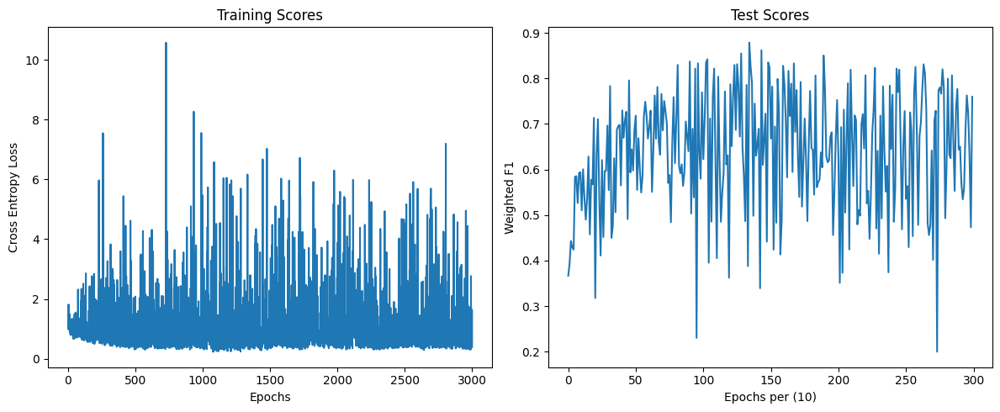

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
sigmoid function chosen for last layer.
Epoch 0, Training F1: 1.18761278, Test F1: 0.3555
Epoch 700, Training F1: 0.42325258, Test F1: 0.8170
Epoch 1400, Training F1: 2.33945281, Test F1: 0.5982
Epoch 2100, Training F1: 1.79009054, Test F1: 0.5404
Epoch 2800, Training F1: 0.40865492, Test F1: 0.7865
Training Duration: 21.65844750404358


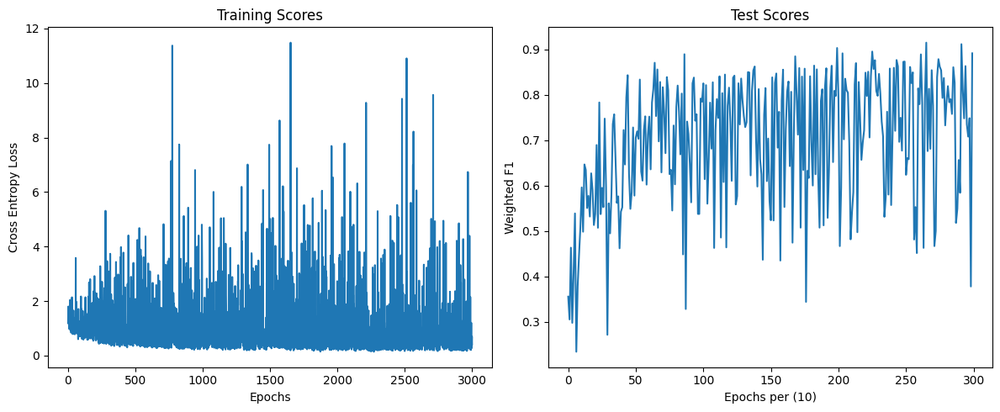

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
sigmoid function chosen for last layer.
Epoch 0, Training F1: 1.16031436, Test F1: 0.3657
Epoch 700, Training F1: 0.59225357, Test F1: 0.7144
Epoch 1400, Training F1: 0.52411650, Test F1: 0.7297
Epoch 2100, Training F1: 0.35204024, Test F1: 0.8193
Epoch 2800, Training F1: 0.27111894, Test F1: 0.8683
Training Duration: 20.813281059265137


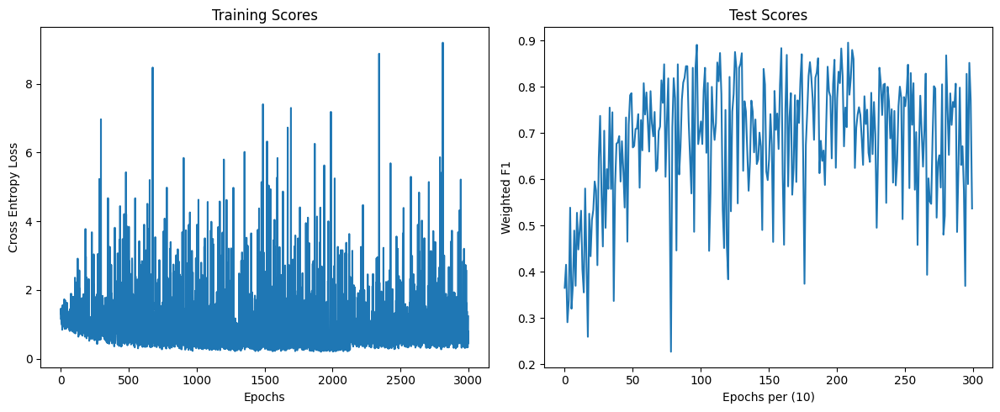

INIT INFO : ------------------------------------------------------------------------------------
No optimisation method
sigmoid function chosen for last layer.
Epoch 0, Training F1: 4.14109035, Test F1: 0.2631
Epoch 700, Training F1: 0.56268314, Test F1: 0.7010
Epoch 1400, Training F1: 0.70658812, Test F1: 0.7057
Epoch 2100, Training F1: 1.25102616, Test F1: 0.6137
Epoch 2800, Training F1: 1.43831303, Test F1: 0.6558
Training Duration: 20.76924705505371


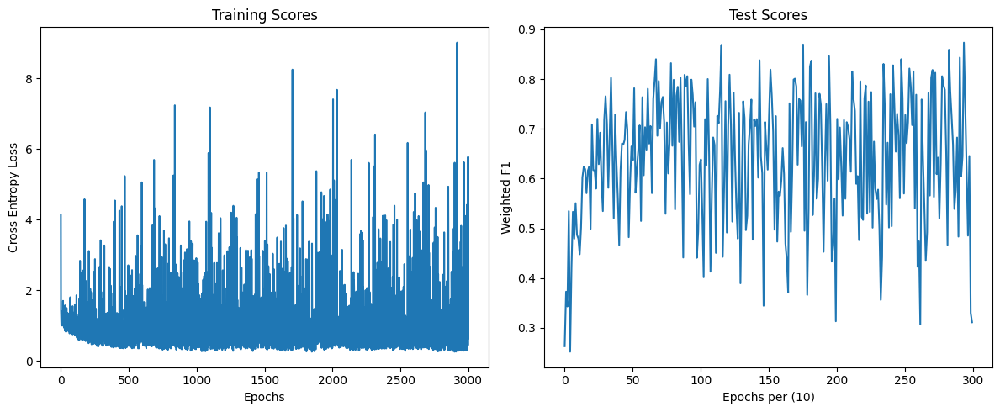

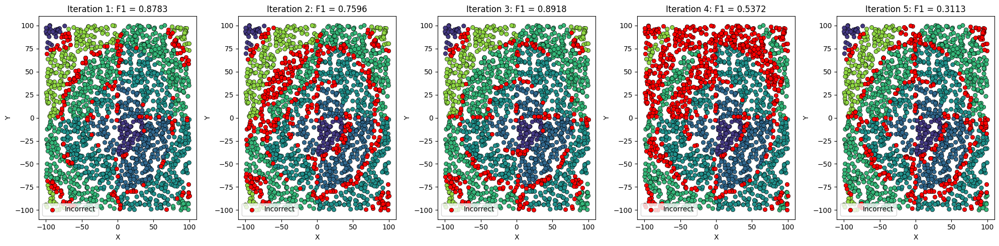

In [38]:
s1_test,s1_final, s1_time, s1_best =  train_5_times_classif(learning_rate=0.01, layers=[2, 18,30,18, 5], activation="relu", last_activation='sigmoid', init=None)